# Advanced-Lane-Lines Project

## Init

In [1]:
import os, sys
import numpy as np
import cv2
import pickle
import glob
import random
from collections import deque
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from scipy import signal
import scipy
from scipy.linalg import svd

from IPython.core.display import display, HTML
display(HTML("""<style>
    div#notebook-container    { width: 80%; }
    div#menubar-container     { width: 80%; }
    div#maintoolbar-container { width: 80%; }
</style>"""))

# pretty formatting of np float arrays
float_formatter = lambda x: "%10.5f" % x
np.set_printoptions(formatter={'float_kind' : float_formatter})



#############################################################################
# Constants and variables
#############################################################################

# Turns debugging images on
image_output= True 
annotate_video=True

# Plot size for plotting images with matplotlib in inches
plot_size = (12, 12)

# amount of corners on chessboard pattern
nx, ny = 9, 6
cam_calib_file = "cam_calib_params.p"

# list of calibration images
calib_files = glob.glob("./camera_cal/calibration*.jpg")
test_files  = glob.glob("./test_images/*.jpg")

# Parameters for ROI selection
roi_height = 0.63
dist_from_side = 0.25 # realtive to image width, max. value: 0.5 -> triangle
ignore_mask_color = 255

# Parameters for unwarping
offset = 300 # distance from outer corners of undistorted image to the border in unwarped perspective

## Helper functions
Some of them have been used during *P2 - Finding lane*.

In [2]:
class RingBuffer():
    "A 1D ring buffer using numpy arrays"
    def __init__(self, length):
        self.data = np.zeros(length, dtype='f')
        self.index = 0

    def extend(self, x):
        "adds array x to ring buffer"
        x_index = (self.index + np.arange(x.size)) % self.data.size
        self.data[x_index] = x
        self.index = x_index[-1] + 1

    def get(self):
        "Returns the first-in-first-out data in the ring buffer"
        idx = (self.index + np.arange(self.data.size)) %self.data.size
        return self.data[idx]


def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)


def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)


def normalize_img(img):
    # use histogram equalization to make sure image has a good contrast
    # for edge detection and thresholding
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img = clahe.apply(img)
    img = img / np.max(img)
    return img


def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    return cv2.bitwise_and(img, mask)


def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)

            
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img


# Python 3 has support for cool math symbols.
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)


def filter_and_extrapolate_lines(lines, image, slope_threshold_low = 0.5, slope_threshold_high = 0.8, verbose=False):
    """
    Filter out lines and assign lines to the left or right lane group according to their slope.
    The line equation is: y = m*x + b
    When we detect a line with a positive slope and a value greater than the pos_threshold
    it gets assigned to the left group, if the slope is negative and smaller than the negative
    threshold it gets assigned to the right group.
    
    At the end we do a linear regression line fitting for both the left and right lane lines.
    """

    if len(lines) == 0:
        print("No lines in array!")
        return []

    if verbose: 
        print("Extracting lane from %d lines" % len(lines))
    
    lane_lines  = []
    left_idx    = []
    right_idx   = []
    outlier_cnt = 0
    
    minimum_y = image.shape[0] 
    maximum_y = image.shape[0]

    # filter out lines and assign them to the left or right lane group
    for i, line in enumerate(lines):
        for x1,y1,x2,y2 in line:
            deltX = x2-x1
            deltY = y2-y1
            slope = deltY / deltX
            length = np.sqrt(deltX**2 + deltY**2)
            # TODO: use also length as criterion for line selection...

            # if positive slope, assign to right lane group
            if (slope > slope_threshold_low and slope < slope_threshold_high): 
                if verbose: print("\tFound left lane line with slope=%.2f and length=%.2f" % (slope, length)) 
                right_idx.append(i)

            # if negative slope, assign to left lane group
            elif (slope < -slope_threshold_low and slope > -slope_threshold_high): 
                if verbose: print("\tFound right lane line with slope=%.2f and length=%.2f" % (slope, length))
                left_idx.append(i)

            # this must be an outlier
            else:
                if verbose: print("\tFound outlier line with slope=%.2f and length=%.2f" % (slope, length))
                outlier_cnt+=1

            # update the min y (horizon)
            minimum_y = min(min(y1, y2), minimum_y)

    if verbose:
        print("Result: %d left, %d right and %d outlier detected" % (len(left_idx), len(right_idx), outlier_cnt))

    if len(right_idx) == 0 or len(left_idx) == 0:
        print("Couldn't detect both road lanes in the list of lines, %d left and %d right :(" % \
             (len(left_idx), len(right_idx)))
        return []

    # pick out xs and ys from lines array
    left_xs  = np.array(lines[left_idx][:, :, 0:3:2]).flatten()
    left_ys  = np.array(lines[left_idx][:, :, 1:4:2]).flatten()
    right_xs = np.array(lines[right_idx][:, :, 0:3:2]).flatten()
    right_ys = np.array(lines[right_idx][:, :, 1:4:2]).flatten()
    
    # run linear regression for line fitting over collected points for both left and right lane
    left_slope,  left_intercept  = np.polyfit(left_xs,  left_ys, 1)
    #ransac_polyfit(left_xs, left_ys, order=1, n=left_xs.size//2, k=left_xs.size//2, d=left_xs.size//2, t=0.4)
    right_slope, right_intercept = np.polyfit(right_xs, right_ys, 1)
    #ransac_polyfit(right_xs, right_ys, order=1, n=left_xs.size//2, k=left_xs.size//2, d=left_xs.size//2, t=0.4)
    # def ransac_polyfit(x, y, order=3, n=20, k=100, t=0.1, d=100, f=0.8)
    
    # calculate pixel coordinates to describe the left and right lane line
    left_x1  = int((minimum_y - left_intercept)  / left_slope)
    left_x2  = int((maximum_y - left_intercept)  / left_slope)
    right_x1 = int((minimum_y - right_intercept) / right_slope)
    right_x2 = int((maximum_y - right_intercept) / right_slope)

    # define the final found lines based on two points and return them
    lane_lines.append([[left_x1,  minimum_y, left_x2,  maximum_y]])
    lane_lines.append([[right_x1, minimum_y, right_x2, maximum_y]])

    return lane_lines


def get_straight_lines(image):
    # Canny edge detectiion parameters
    kernel_size = 3 # for gaussian blur before canny edge detection
    canny_low_threshold  = 100
    canny_high_threshold = 200

    # Parameters for hough line extraction
    hough_rho = 1
    hough_theta = np.pi / 360
    hough_threshold = 20
    hough_min_line_len = 30
    hough_max_line_gap = 60

    # Slope threshold for line filtering and extrapolation
    slope_threshold_low  = 0.5
    slope_threshold_high = 0.8

    ysize, xsize = image.shape[0], image.shape[1]
    
    # Use S channel of HLS colourspace
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]

    # first smooth image to get better results during edge detection
    img = gaussian_blur(S, kernel_size)
    gray = canny(img, canny_low_threshold, canny_high_threshold)

    # creating a region of interest (symmetric trapezoid) to only select interesting area in image
    vertices = np.array([[(0,                        ysize),
                          (xsize*dist_from_side,     ysize*roi_height),
                          (xsize*(1-dist_from_side), ysize*roi_height),
                          (xsize,                    ysize)
                         ]], dtype=np.int32)
    masked_img = region_of_interest(gray, vertices)
    
    # extracting straight lines from edges
    lines = cv2.HoughLinesP(masked_img, hough_rho, hough_theta, hough_threshold, np.array([]),
                            hough_min_line_len, hough_max_line_gap)

    lines2 = filter_and_extrapolate_lines(lines, undist, slope_threshold_low, slope_threshold_high, verbose=False)
    return lines2


# A simple polynomial RANSAC implementation using polyfit and polyval
def ransac_polyfit(x, y, order=3, n=10, k=100, t=0.1, d=100, f=0.8):
    # Thanks https://en.wikipedia.org/wiki/Random_sample_consensus
    # n – minimum number of data points required to fit the model
    # k – maximum number of iterations allowed in the algorithm
    # t – threshold error value to determine when a data point fits a model
    # d – number of close data points required to assert that a model fits well to data
    # f – fraction of close data points required
    x = np.array(x)
    y = np.array(y)
    besterr = np.inf
    bestfit = np.zeros((order+1))
    for kk in range(k):
        maybeinliers = np.random.choice(x.size, size=n, replace=False) #random.sample(range(len(x)), int(n))
        maybemodel, cov = np.polyfit(x[maybeinliers], y[maybeinliers], order, cov=True)
        alsoinliers = np.abs(np.polyval(maybemodel, x)-y) < t
        if sum(alsoinliers) > d and sum(alsoinliers) > x.size*f:
            bettermodel, cov = np.polyfit(x[alsoinliers], y[alsoinliers], order, cov=True)
            #print("bettermodel: ", bettermodel)
            thiserr = np.sum(np.abs(np.polyval(bettermodel, x[alsoinliers])-y[alsoinliers]))
            if thiserr < besterr:
                bestfit = bettermodel
                besterr = thiserr
    
    # We only want to diagonal variance elements
    cov = np.diag(cov)
    return bestfit , cov, besterr

#
# This is an approach to use a non-linear least-squares optimizer with the "cauchy" weighting function for outlier rejection
#
def least_squares_covariance(opt_res):
    # Do Moore-Penrose inverse discarding zero singular values.
    _, s, VT = svd(opt_res.jac, full_matrices=False)
    threshold = np.finfo(float).eps * max(opt_res.jac.shape) * s[0]
    s = s[s > threshold]
    VT = VT[:s.size]
    s_sq = 2*opt_res.cost / (opt_res.fun.size - opt_res.grad.size)
    return np.dot(VT.T / s**2, VT) * s_sq

def fun(x, t, y):
    return np.polyval(x, t) - y

def poly_fit(x, y, deg=2, x0=np.zeros((3))):
    res_lsq = scipy.optimize.least_squares(fun, x0, args=(x, y), loss="cauchy")
    #print(res_lsq)
    if res_lsq.success:
        cov = np.sqrt(np.diag(least_squares_covariance(res_lsq)))
    else:
        cov = np.zeros((deg))
    return res_lsq.x, cov, res_lsq.optimality

## Camera calibration

In [3]:
def cam_calib(calib_files, corners=(9, 6)):
    # amount of corners on chessboard pattern
    nx, ny = corners
    # 3D points in real world space:
    objpoints = []
    # 2D points in image plane:
    imgpoints = []
    
    # Prepare object points like (0,0,0), ... (nx, ny, 0) for one chess calibration pattern
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:, 0:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    for file in calib_files:
        img = mpimg.imread(file)
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        if ret == False:
            print("Couldn't detect (%d, %d) corners in image %s" % (nx, ny, file))
            continue

        # if corners are found add object points and image points
        imgpoints.append(corners)
        objpoints.append(objp)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    print("ret: ", ret)
    return mtx, dist


if not os.path.isfile(cam_calib_file):
    print("Can't find camera calibration file %s, do calibration from scratch!" % cam_calib_file)
    mtx, dist = cam_calib(calib_files, corners=(nx, ny))
    dist_pickle = {
        "mtx"  : mtx,
        "dist" : dist
    }
    pickle.dump( dist_pickle, open(cam_calib_file, "wb" ) )

else:
    # load camera calibration parameters from pickle file
    with open(cam_calib_file, mode='rb') as f:
        dist_pickle = pickle.load(f)
    print("Loaded camera calibration from file %s:" % cam_calib_file)

print("camera matrix:\n%s" % dist_pickle["mtx"])
print("distortion coefficients (k1, k2, p1, p2, k3):\n%s" % dist_pickle["dist"])

Loaded camera calibration from file cam_calib_params.p:
camera matrix:
[[1153.96093    0.00000  669.70536]
 [   0.00000 1148.02496  385.65623]
 [   0.00000    0.00000    1.00000]]
distortion coefficients (k1, k2, p1, p2, k3):
[[  -0.24102   -0.05307   -0.00116   -0.00013    0.02671]]


** Visualizing camera calibration **

Showing undistorted 5 random images from calibration dataset:


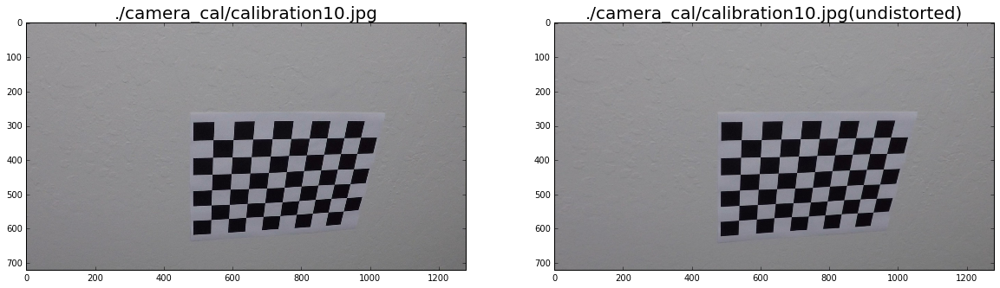

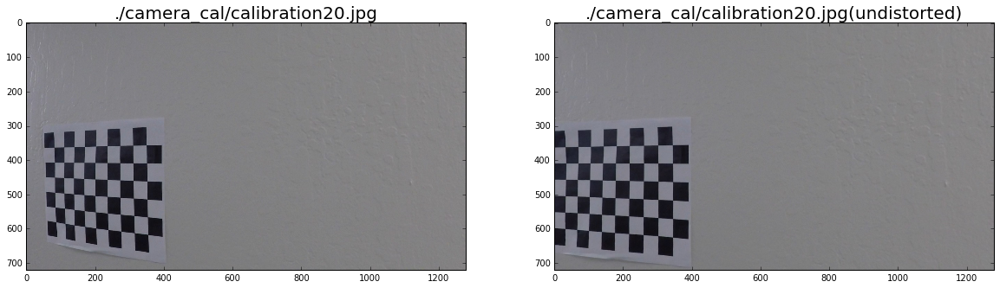

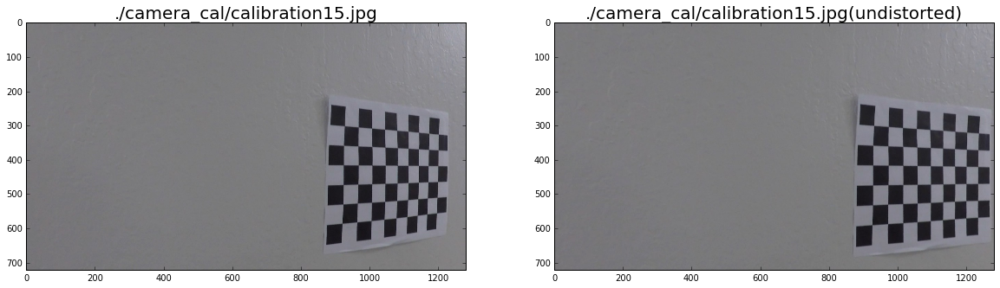

In [4]:
print("Showing undistorted 5 random images from calibration dataset:")
for file in random.sample(calib_files, 3):
    img = mpimg.imread(file)
    dst = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title(file, fontsize=20)
    ax2.imshow(dst)
    ax2.set_title(file + "(undistorted)", fontsize=20)

    plt.show()

## Regin of interest masking

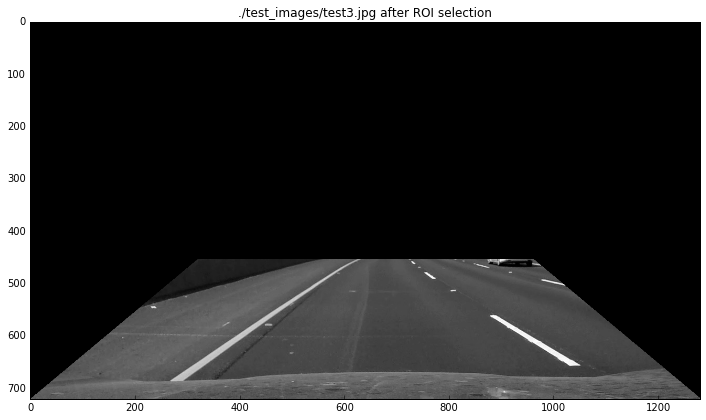

In [5]:
test_files_roi = glob.glob("./test_images/straight*.jpg")
for file in random.sample(test_files, 1):
    img = mpimg.imread(file)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    xsize, ysize = (img.shape[1], img.shape[0])

    # creating a region of interest (symmetric trapezoid) to only select interesting area in image
    vertices = np.array([[(0,                        ysize),   \
                          (xsize*dist_from_side,     ysize*roi_height), \
                          (xsize*(1-dist_from_side), ysize*roi_height), \
                          (xsize,                    ysize) \
                         ]], dtype=np.int32)

    masked_img = region_of_interest(gray, vertices)
    if image_output:
        fig = plt.figure(figsize=plot_size)
        plt.title(file + " after ROI selection")
        plt.imshow(masked_img, cmap='gray')
        plt.show()


## Using colourspaces

Use components of different colourspaces to be invariant against changes in colour and luminance, for example be invariant against road markings in different colours.

Using the *saturation* channel S in colourspace *HLS* has exactly this advantage, it is only describing the changes in saturation but very invariant against changes in luminance and hues / colours.
This channel is therefore used in edge detection.

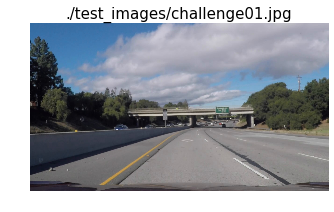

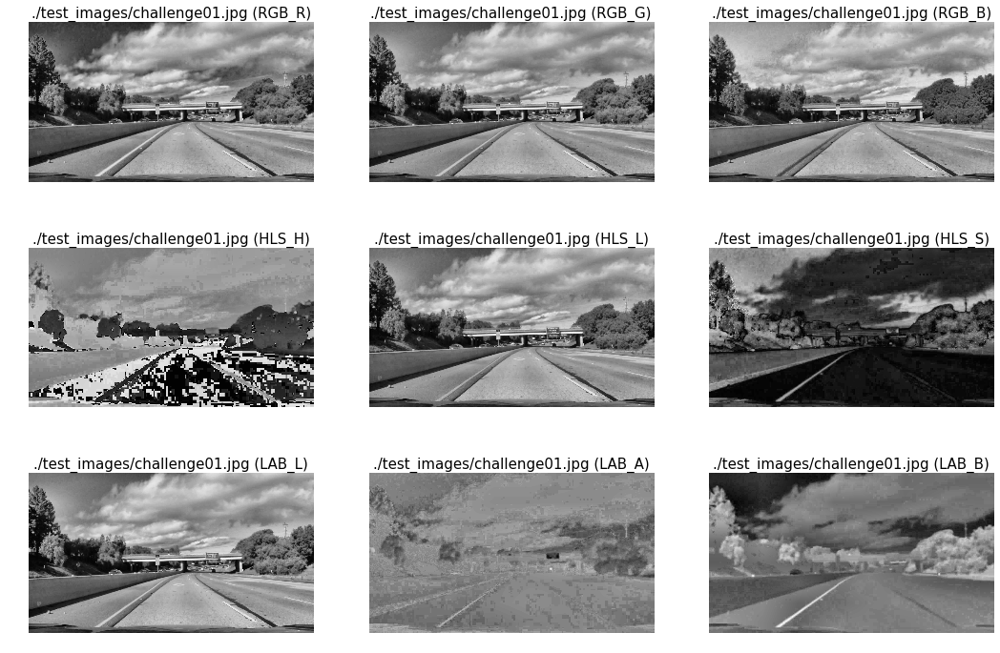

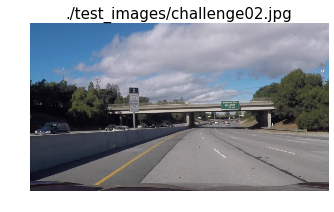

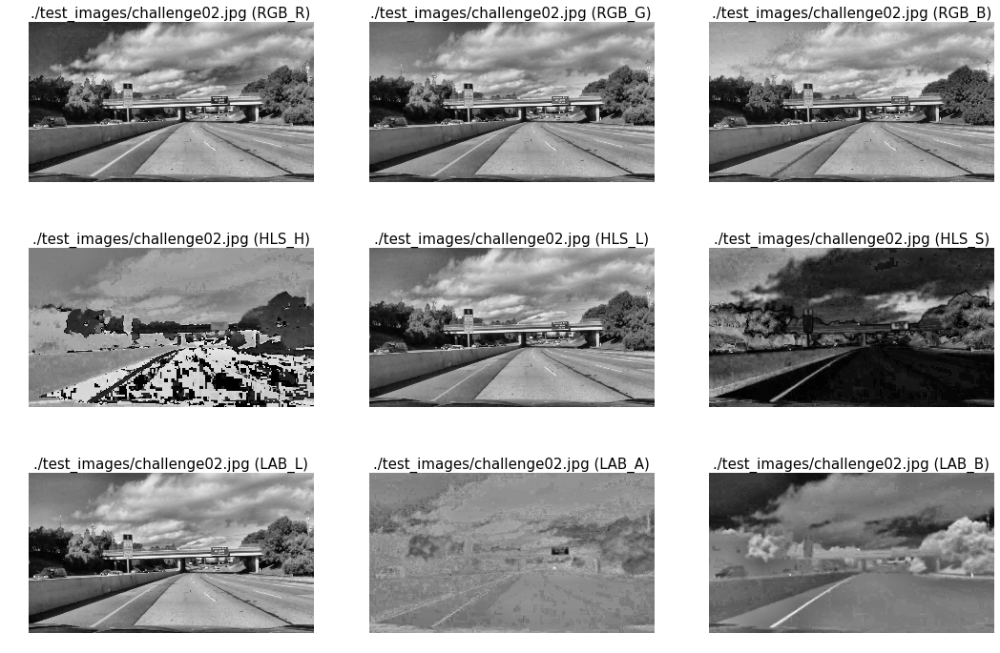

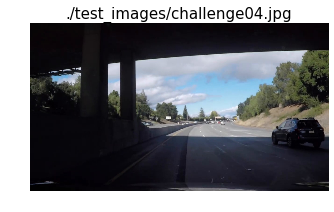

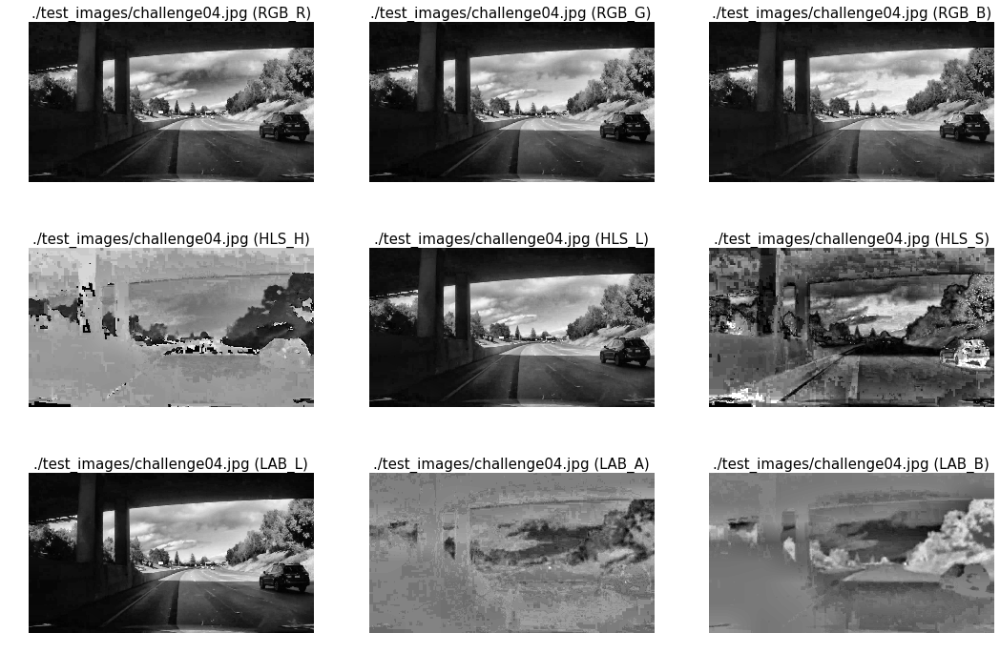

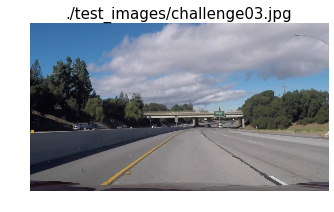

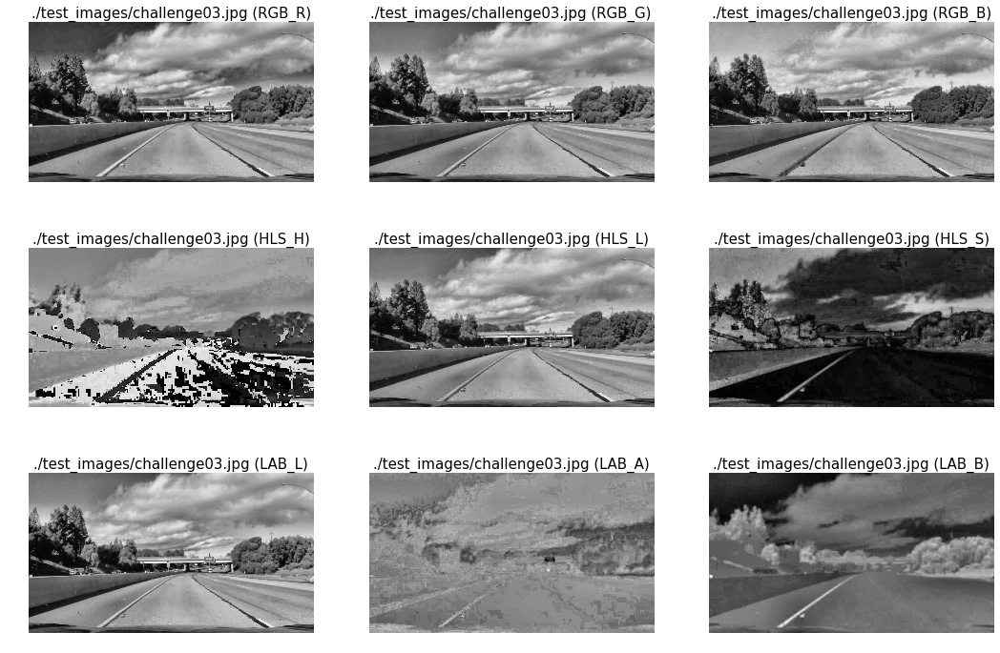

In [6]:
%matplotlib inline

test_files_challenge = glob.glob("./test_images/challenge*.jpg")
for file in test_files_challenge: #random.sample(test_files, 4):
    img = mpimg.imread(file)
    f, ax = plt.subplots(1, 1, figsize=(6,3))
    ax.imshow(img)
    ax.set_title(file, fontsize=15)
    ax.set_axis_off()
    plt.show()
    rgb_r, rgb_g, rgb_b  = [normalize_img(img[:,:,i]) for i in range(3)]

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_h, hls_l, hls_s = [normalize_img(hls[:,:,i]) for i in range(3)]

    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    lab_l, lab_a, lab_b = [normalize_img(lab[:,:,i]) for i in range(3)]
    
    # Visualize images
    channels = [rgb_r, rgb_g, rgb_b, hls_h, hls_l, hls_s, lab_l, lab_a, lab_b]
    texts = [" (RGB_R)", " (RGB_G)", " (RGB_B)", " (HLS_H)", " (HLS_L)", " (HLS_S)", " (LAB_L)", " (LAB_A)", " (LAB_B)"]
    f, axes = plt.subplots(3, 3, figsize=(15,10))
    for ax, channel, text in zip(axes.flatten(), channels, texts):
        ax.imshow(channel, cmap='gray')
        ax.set_title(file + text, fontsize=15)
        ax.set_axis_off()
    plt.tight_layout()
    plt.show()

## Finding good thresholds

<IPython.core.display.Javascript object>


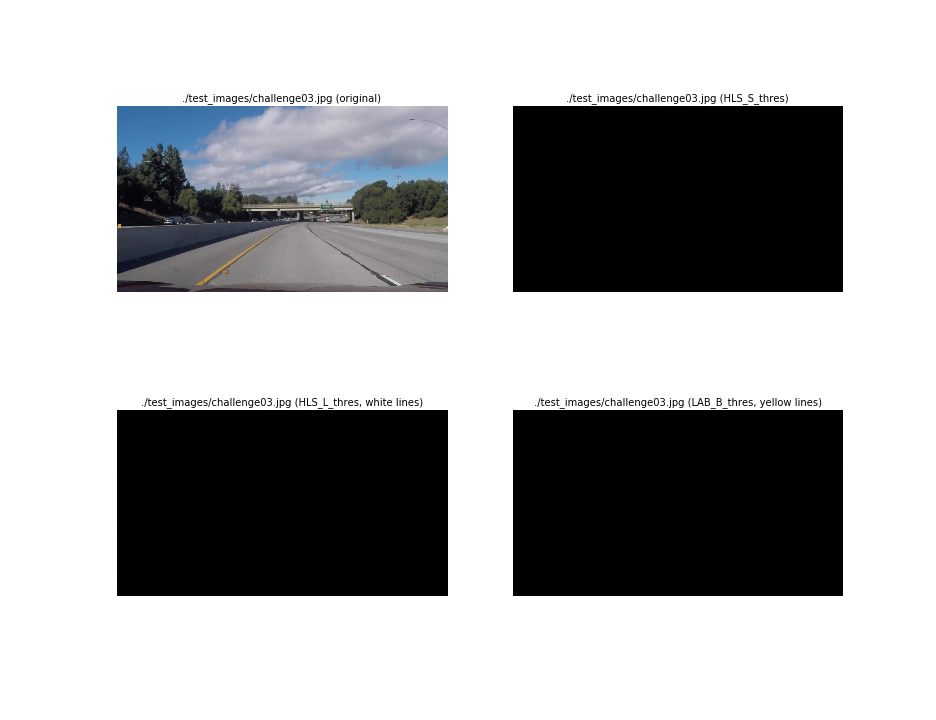

Pixels == 1 (thresh_s): 395694
Pixels == 1 (thresh_l): 1638528
Pixels == 1 (thresh_b): 2401302


<IPython.core.display.Javascript object>


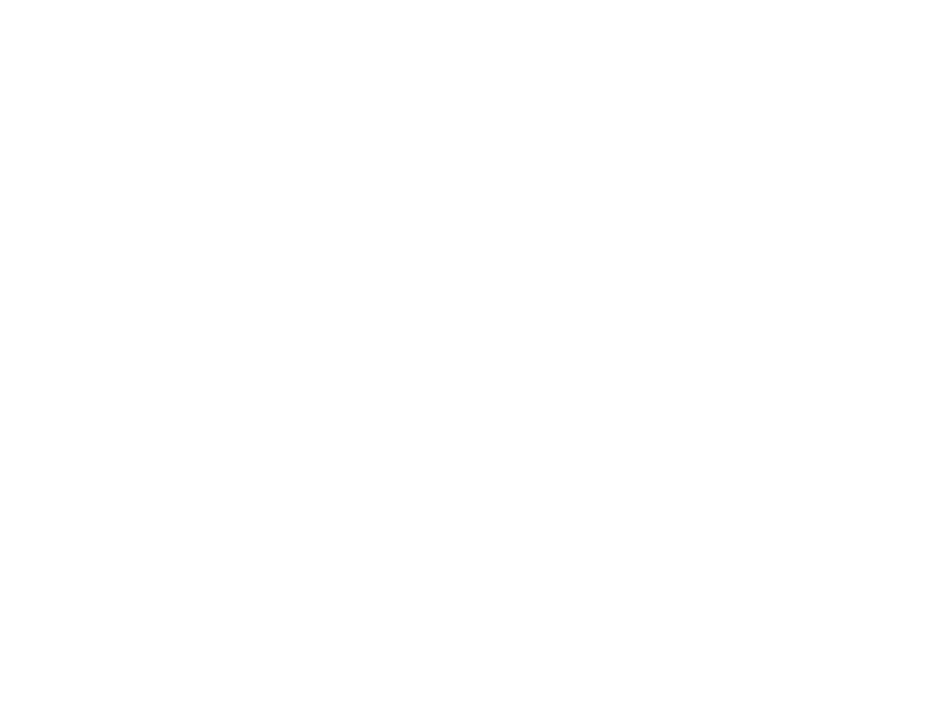

In [7]:
%matplotlib notebook
from ipywidgets import interact, interactive, fixed, interact_manual, widgets
from IPython.core.display import display

file = "./test_images/challenge03.jpg"
#file = "./test_images/test1.jpg"

img = mpimg.imread(file)
binary = np.zeros_like(img)
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
hls_h, hls_l, hls_s = [normalize_img(hls[:,:,i]) for i in range(3)]
lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
lab_l, lab_a, lab_b = [normalize_img(lab[:,:,i]) for i in range(3)]

plt.ion()

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(13,10))
ax1.imshow(img)
ax1.set_title(file + " (original)", fontsize=10)
ax1.set_axis_off()
#fig.show()
fig.canvas.draw()

threshold_names = ["thresh_s", "thresh_l", "thresh_b"]

def update(which_thresh, thresh):
    #print("Updating %s: %s" % (which_thresh, thresh))
    binary[:] = 0
    if which_thresh == threshold_names[0]:
        binary[(hls_s > thresh[0])   & (hls_s <= thresh[1])] = 1
        ax2.imshow(binary, cmap="gray")
        ax2.set_title(file + " (HLS_S_thres)", fontsize=10)
        ax2.set_axis_off()
    elif which_thresh == threshold_names[1]:
        binary[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
        ax3.imshow(binary, cmap='gray')
        ax3.set_title(file + " (HLS_L_thres, white lines)", fontsize=10)
        ax3.set_axis_off()
    elif which_thresh == threshold_names[2]:
        binary[(lab_b > thresh[0]) & (lab_b <= thresh[1])] = 1
        ax4.imshow(binary, cmap='gray')
        ax4.set_title(file + " (LAB_B_thres, yellow lines)", fontsize=10)
        ax4.set_axis_off()
    #plt.tight_layout()
    #plt.show()
    #fig.show()
    fig.canvas.draw()
    #plt.draw()
    print("Pixels == 1 (%s): %d" % (which_thresh, np.sum(binary)))

def on_value_changed(val):
    update(val["owner"].description, list(val["new"]))

    
w_thresh_s, w_thresh_l, w_thresh_b = [
    widgets.FloatRangeSlider(value=[0.5, 1.0], min=0,  max=1.0,  step=0.05, description=name,
        disabled=False,  continuous_update=False, orientation="horizontal", readout=True, readout_format='.2f')
    for name in threshold_names
]

w_thresh_s.observe(on_value_changed, names='value'), display(w_thresh_s)
w_thresh_l.observe(on_value_changed, names='value'), display(w_thresh_l)
w_thresh_b.observe(on_value_changed, names='value'), display(w_thresh_b)

for name in threshold_names:
    update(name, (0.5, 1))

#plt.show()

## Testing found threshold values on various images

final thresh: [0.9100000000000005, 1.0], pixels: 9978
final thresh: [0.8700000000000001, 1.0], pixels: 8894
final thresh: [0.8500000000000001, 1.0], pixels: 9588


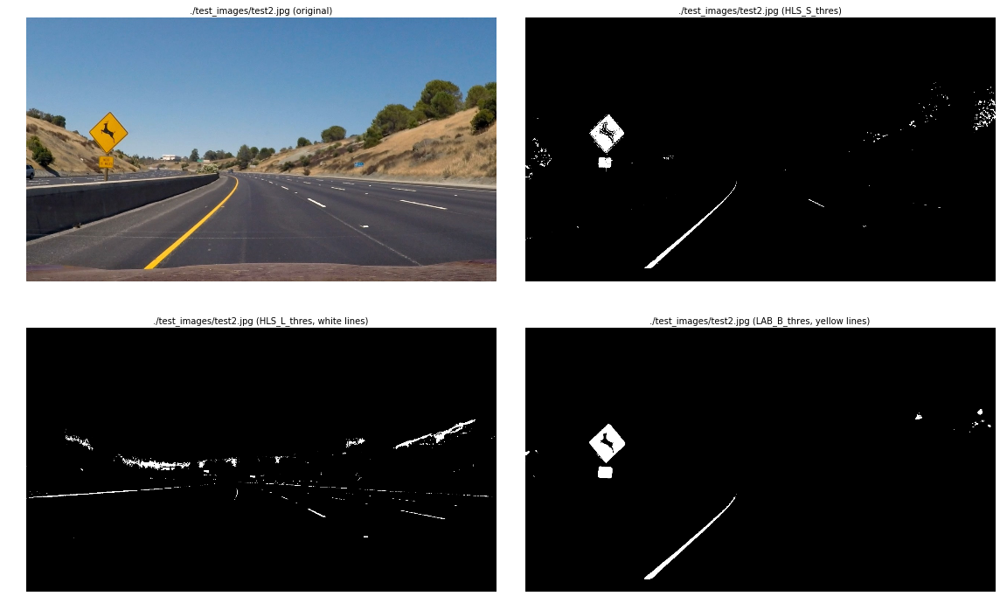

final thresh: [1.0000000000000004, 1.0], pixels: 12843
final thresh: [0.9500000000000002, 1.0], pixels: 8509
final thresh: [0.8400000000000001, 1.0], pixels: 8618


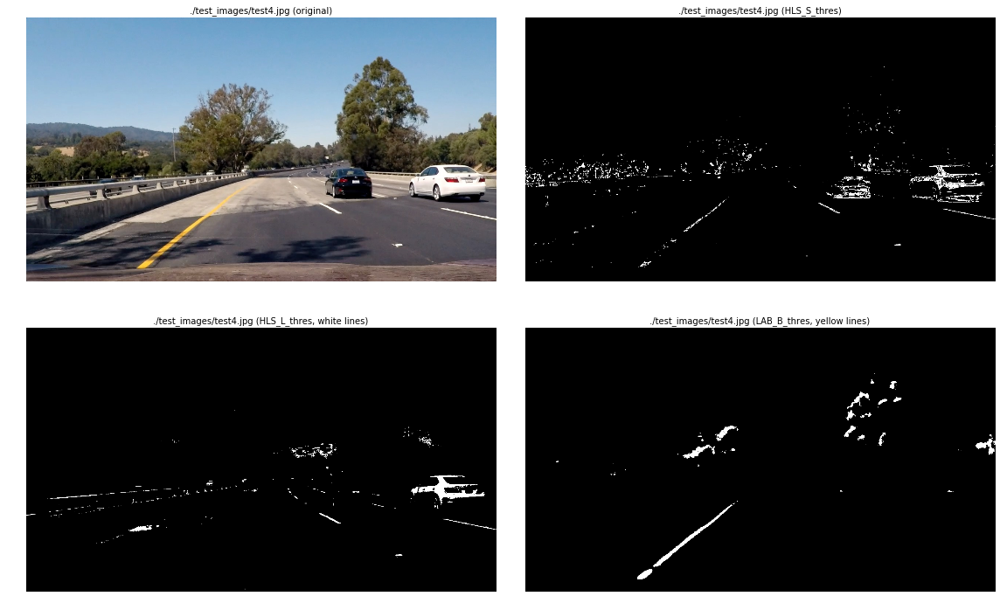

final thresh: [1.0000000000000004, 1.0], pixels: 59736
final thresh: [0.9100000000000001, 1.0], pixels: 8034
final thresh: [0.8400000000000001, 1.0], pixels: 9185


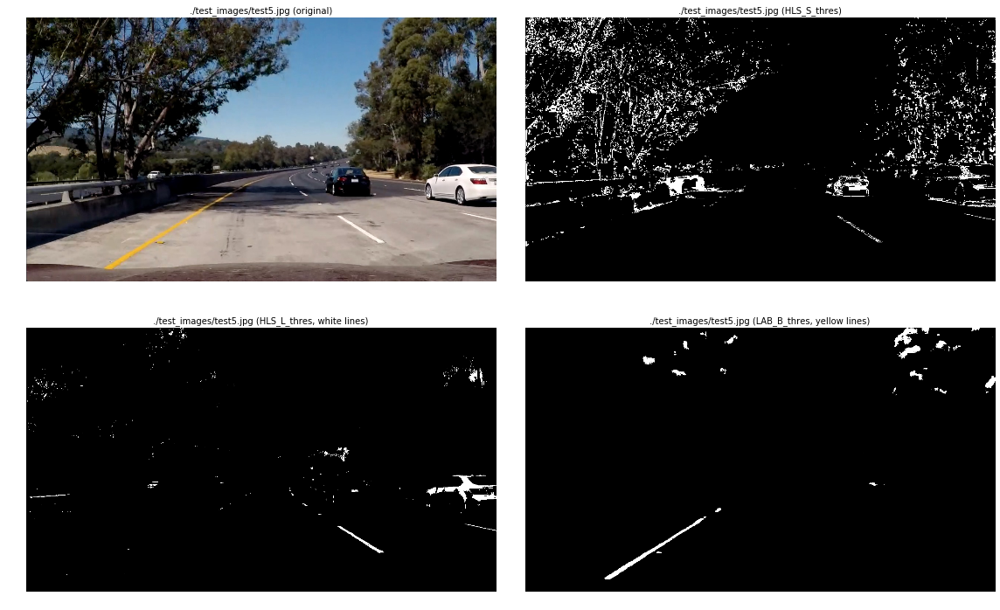

final thresh: [0.7800000000000004, 1.0], pixels: 9701
final thresh: [0.8600000000000001, 1.0], pixels: 8913
final thresh: [0.8300000000000001, 1.0], pixels: 7328


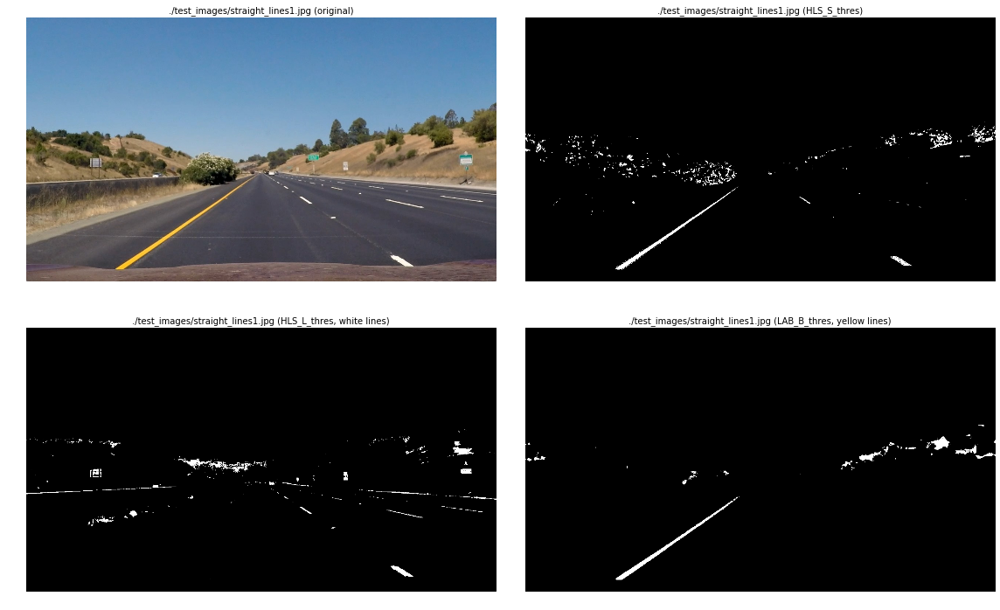

final thresh: [0.7500000000000003, 1.0], pixels: 9412
final thresh: [0.8700000000000001, 1.0], pixels: 8445
final thresh: [0.8400000000000001, 1.0], pixels: 8926


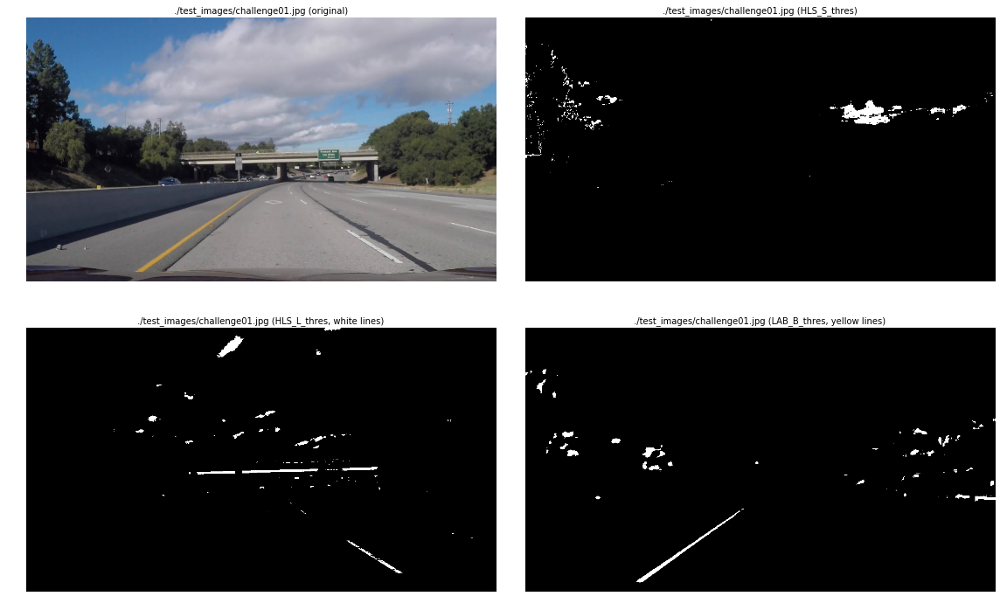

final thresh: [1.0000000000000004, 1.0], pixels: 12059
final thresh: [0.8700000000000001, 1.0], pixels: 9452
final thresh: [0.9000000000000001, 1.0], pixels: 8096


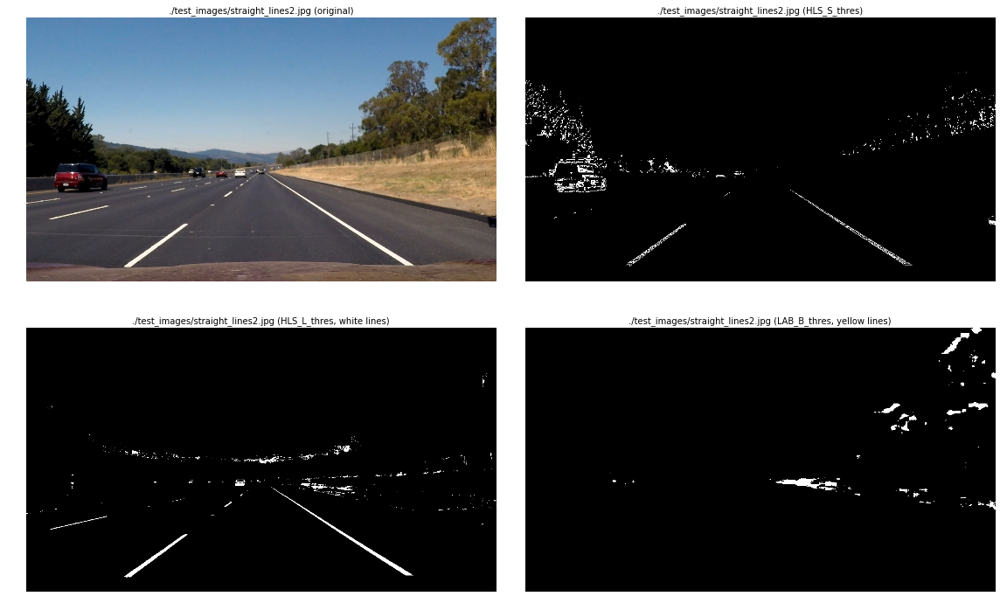

final thresh: [0.7200000000000003, 1.0], pixels: 9371
final thresh: [0.8700000000000001, 1.0], pixels: 9467
final thresh: [0.8500000000000001, 1.0], pixels: 8061


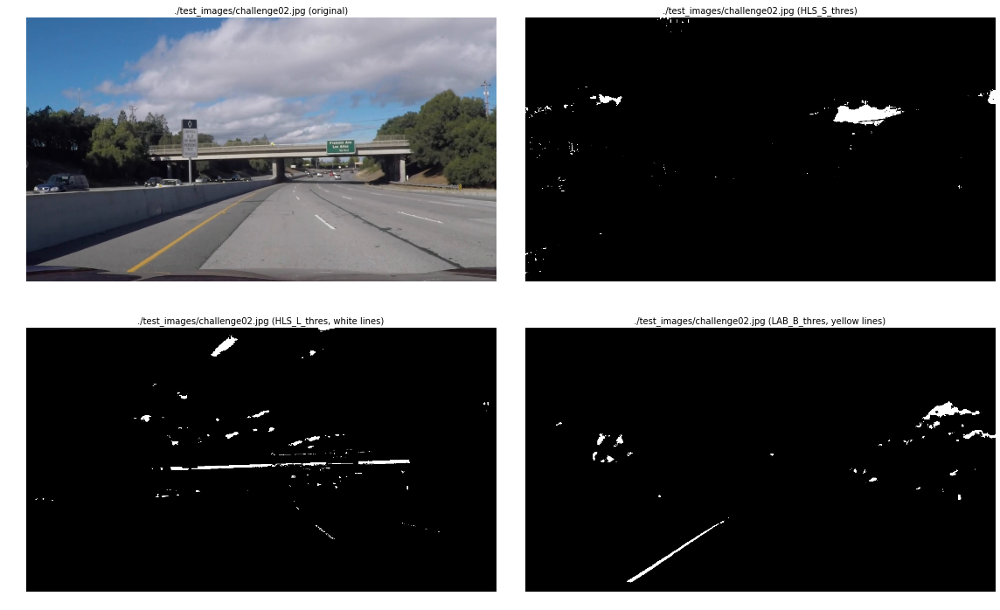

final thresh: [0.9400000000000005, 1.0], pixels: 9887
final thresh: [0.9100000000000001, 1.0], pixels: 9848
final thresh: [0.8900000000000001, 1.0], pixels: 9266


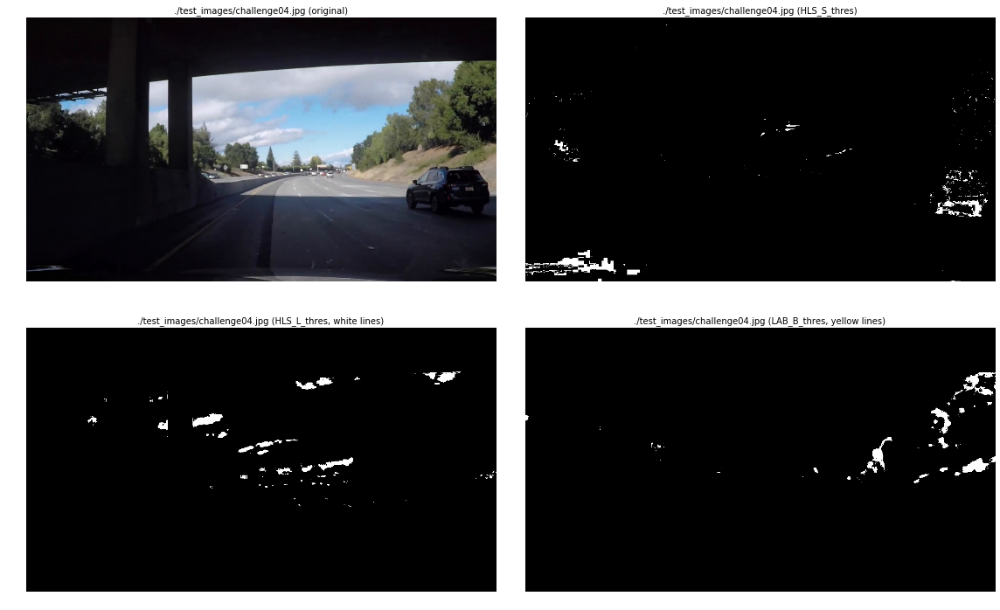

final thresh: [0.6500000000000002, 1.0], pixels: 9680
final thresh: [0.8300000000000001, 1.0], pixels: 8347
final thresh: [0.78, 1.0], pixels: 9232


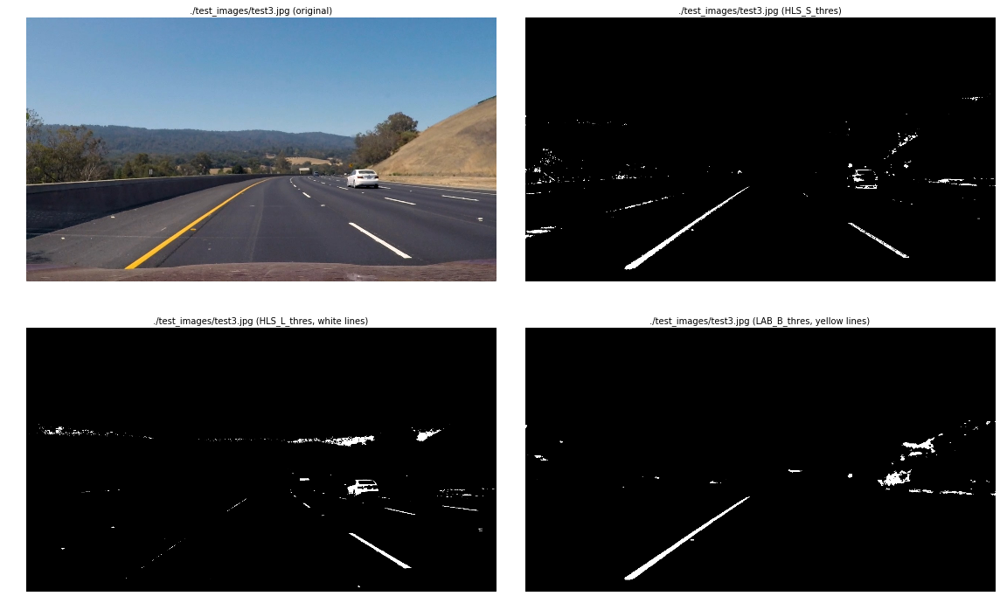

final thresh: [1.0000000000000004, 1.0], pixels: 11216
final thresh: [0.9300000000000002, 1.0], pixels: 9223
final thresh: [0.81, 1.0], pixels: 8884


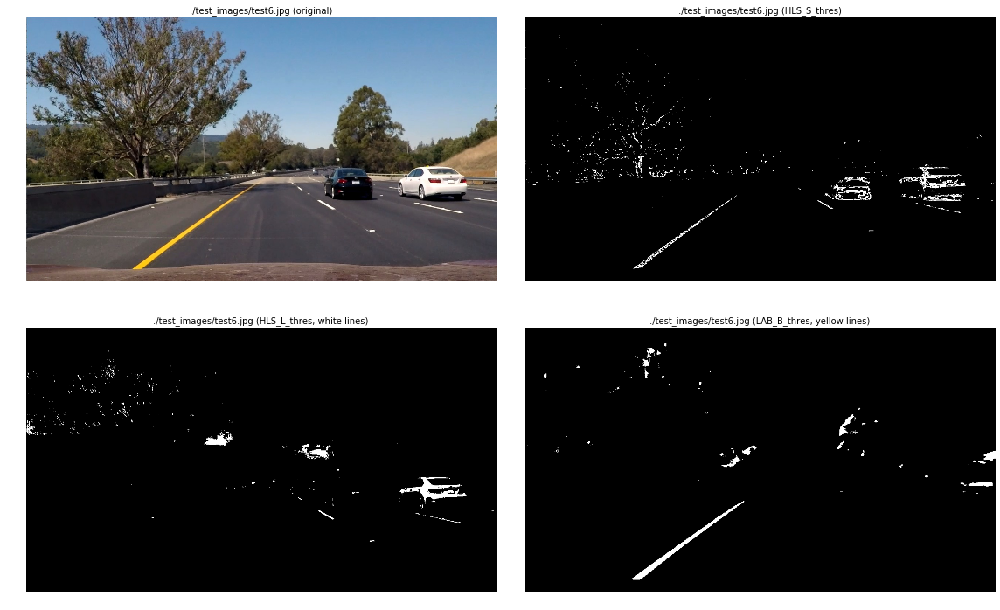

final thresh: [0.7300000000000003, 1.0], pixels: 9897
final thresh: [0.8700000000000001, 1.0], pixels: 8176
final thresh: [0.8, 1.0], pixels: 9199


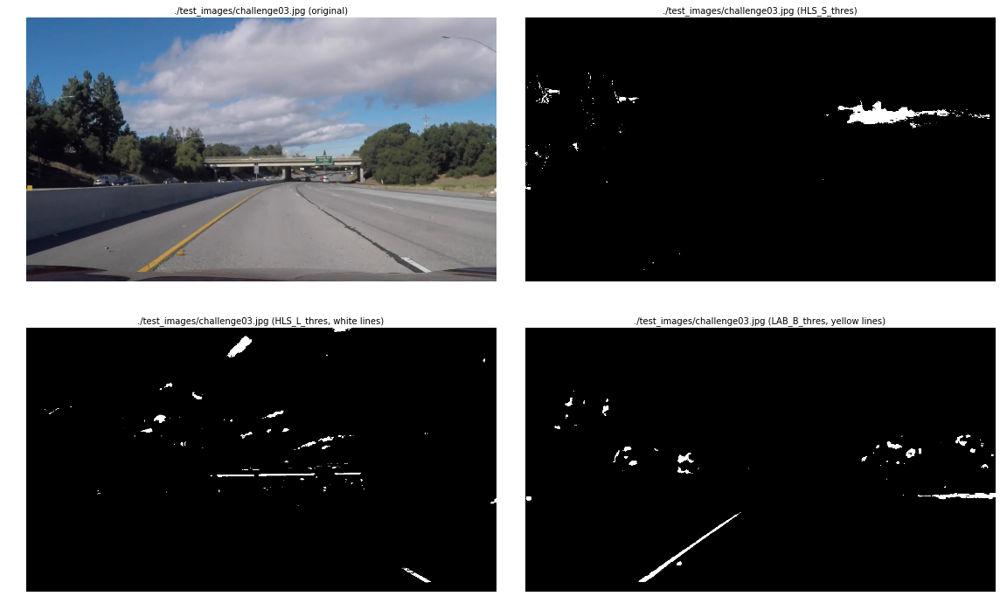

final thresh: [1.0000000000000004, 1.0], pixels: 11397
final thresh: [0.9400000000000002, 1.0], pixels: 7742
final thresh: [0.8500000000000001, 1.0], pixels: 7688


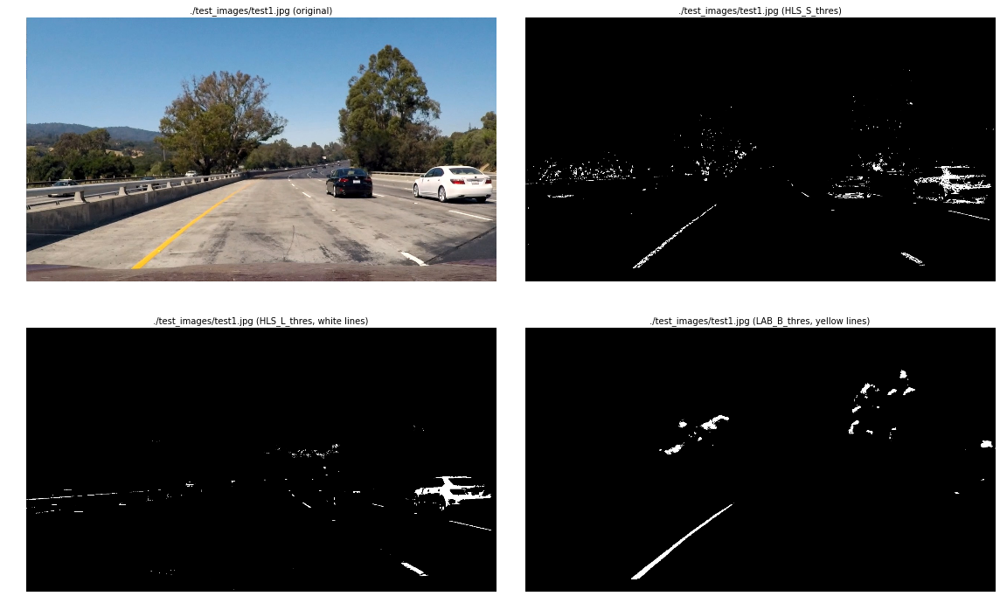

In [8]:
%matplotlib inline

thresh_s = [0.4, 1.0]
thresh_l = [0.7, 1.0]
thresh_b = [0.7, 1.0]
    
max_pixel_cnt = 10000

def optimize_thresholds(img, thresh, max_pixel_cnt):
    incr = 0.01
    binary = np.zeros_like(img)
    while True:
        binary[:] = 0
        binary[(img > thresh[0]) & (img <= thresh[1])] = 1
        thresh[0] += incr
        pixel_sum = np.sum(binary, axis=(0,1))
        if (pixel_sum < max_pixel_cnt) or thresh[0] >= thresh[1]:
            break

    print("final thresh: %s, pixels: %d" % (thresh, np.sum(binary, axis=(0,1))))
    return binary


test_files_challenge = glob.glob("./test_images/challenge*.jpg")
for file in test_files: #_challenge: #random.sample(test_files, 4):
    img = mpimg.imread(file)
    img_roi = img #region_of_interest(img, vertices)
    
    thresh_s = [0.4, 1.0]
    thresh_l = [0.7, 1.0]
    thresh_b = [0.7, 1.0]
    
    # color space convertions
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_h, hls_l, hls_s = [normalize_img(hls[:,:,i]) for i in range(3)]
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    lab_l, lab_a, lab_b = [normalize_img(lab[:,:,i]) for i in range(3)]
    
    binary_s = optimize_thresholds(hls_s, thresh_s, max_pixel_cnt)
    binary_l = optimize_thresholds(hls_l, thresh_l, max_pixel_cnt)
    binary_b = optimize_thresholds(lab_b, thresh_b, max_pixel_cnt)
    
    f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16,10))
    ax1.imshow(img)
    ax1.set_title(file + " (original)", fontsize=10)
    ax1.set_axis_off()
    ax2.imshow(binary_s, cmap="gray")
    ax2.set_title(file + " (HLS_S_thres)", fontsize=10)
    ax2.set_axis_off()
    ax3.imshow(binary_l, cmap='gray')
    ax3.set_title(file + " (HLS_L_thres, white lines)", fontsize=10)
    ax3.set_axis_off()
    ax4.imshow(binary_b, cmap='gray')
    ax4.set_title(file + " (LAB_B_thres, yellow lines)", fontsize=10)
    ax4.set_axis_off()
    plt.tight_layout()
    plt.show()

## Edge detection pipeline

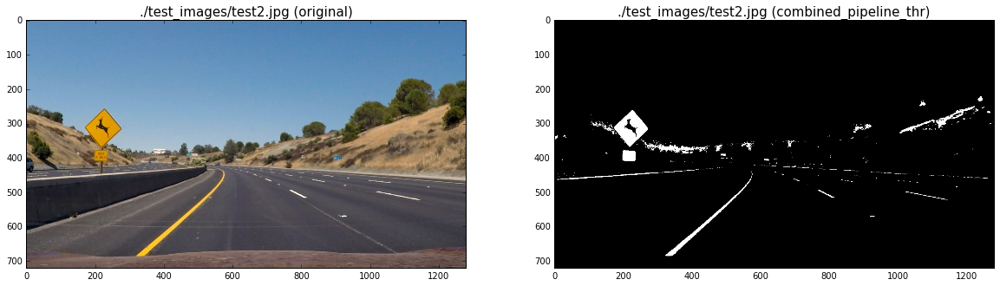

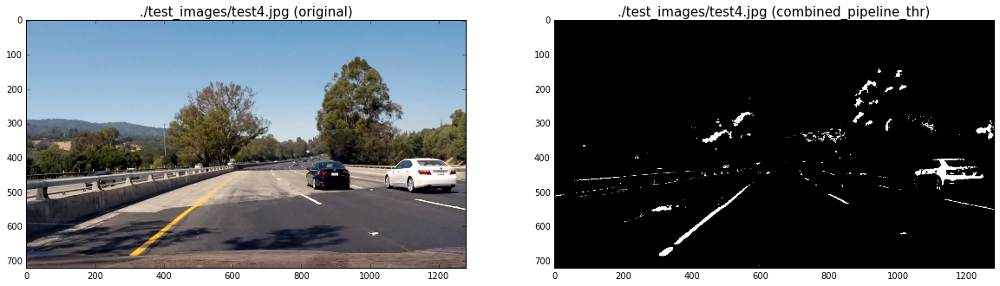

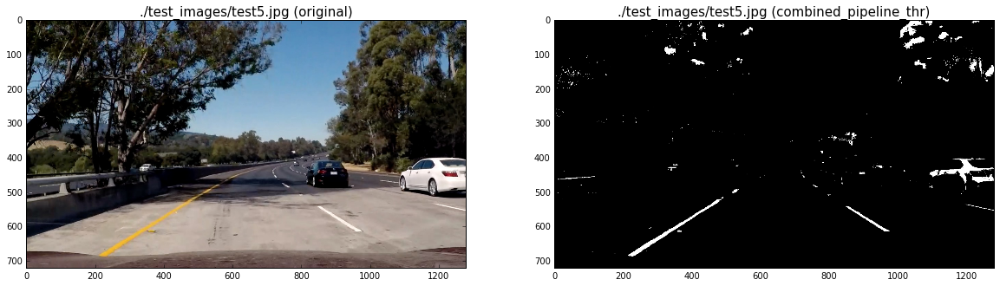

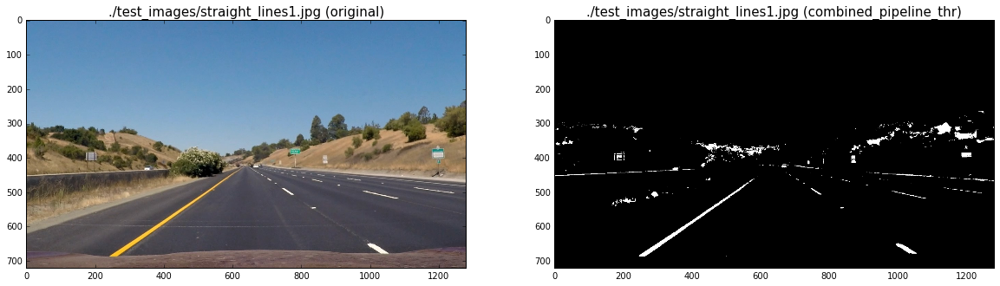

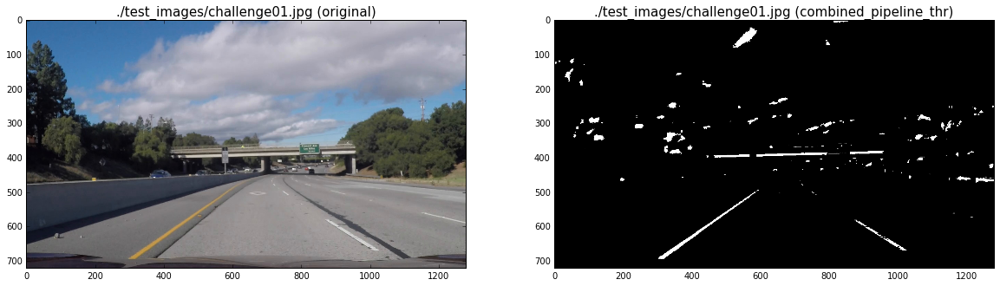

...

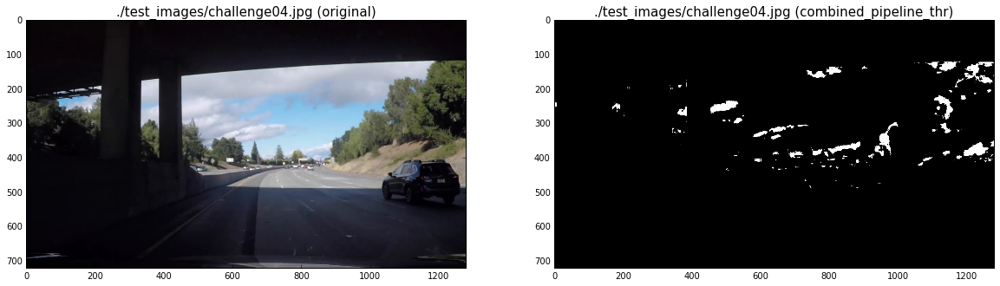

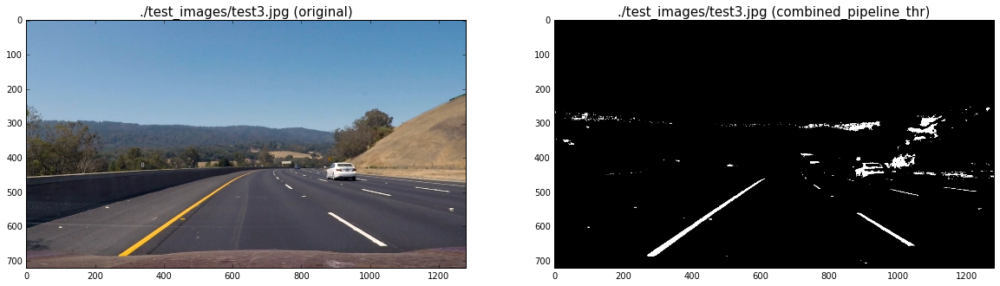

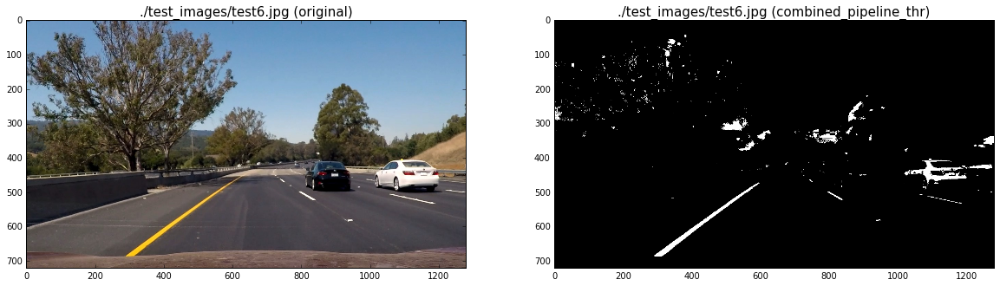

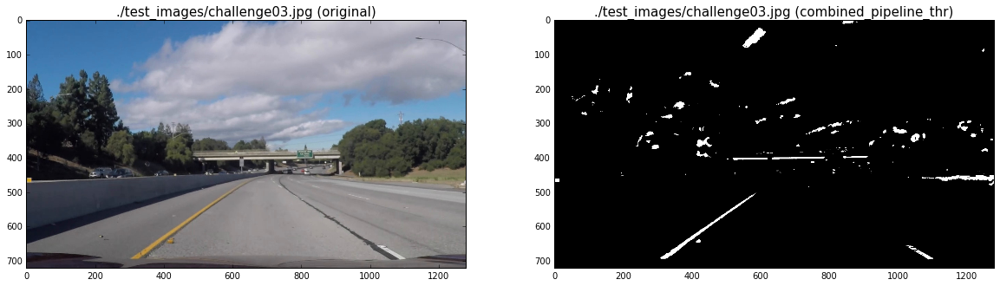

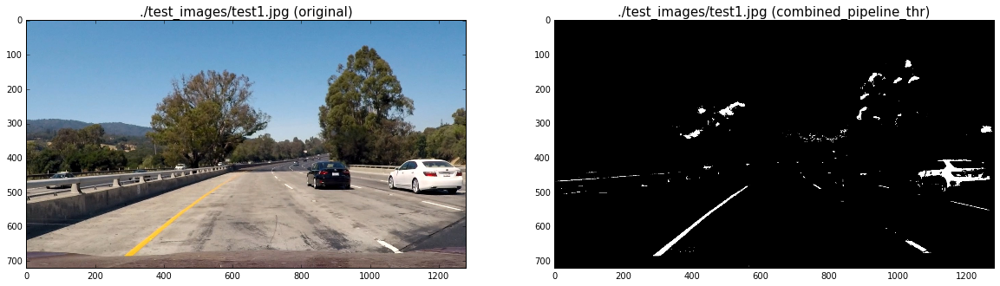

In [9]:
class segmentation():
    def __init__(self, config):
        """
        Params:
            ksize
                Kernel size for sobel filter.
                It should be a large odd number between [1 35] to smooth gradient measurements.
                
            sobel_thresh
                Threshold for normal sobel in x and y direction
                
            sobel_mag_thresh
                Threshold for magnitude sobel [sqrt(sobelx^2 + sobely^2)]
                
            sobel_dir_thresh
                Threshold for directional sobel filter in radians

            hls_s_thresh
                Threshold for S channel in HLS colourspace

            hls_l_thresh
                Threshold for L channel in HLS colourspace
                
            lab_b_thresh
                Threshold for B channel in LAB colourspace
        """
        self.set_config(config)
        
    def set_config(self, config):
        if "ksize" in config:
            self.ksize = config["ksize"]
        else:
            self.ksize = 31
        if "sobel_thresh" in config:
            self.sobel_thresh = config["sobel_thresh"]
        else:
            self.sobel_thresh = [0.11, 0.7]
        if "sobel_mag_thresh" in config:
            self.sobel_mag_thresh = config["sobel_mag_thresh"]
        else:
            self.sobel_mag_thresh = [0.11, 0.7]
        if "sobel_dir_thresh" in config:
            self.sobel_dir_thresh = config["sobel_dir_thresh"]
        else:
            self.sobel_dir_thresh = (np.pi/4, np.pi/2)
        if "hls_s_thresh" in config:
            self.hls_s_thresh = config["hls_s_thresh"]
        else:
            self.hls_s_thresh = [0.4, 1.0]
        if "hls_l_thresh" in config:
            self.hls_l_thresh = config["hls_l_thresh"]
        else:
            self.hls_l_thresh = [0.7, 1.0]
        if "lab_b_thresh" in config:
            self.lab_b_thresh = config ["lab_b_thresh"]
        else:
            self.lab_b_thresh = [0.7, 1.0]
        if "max_pixel_cnt" in config:
            self.max_pixel_cnt = config ["max_pixel_cnt"]
        else:
            self.max_pixel_cnt = 5000

    def abs_sobel_thresh(self, image, orient='x'):
        if orient == 'x':
            sobel = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=self.ksize))
        else:
            sobel = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=self.ksize))
        sobel = sobel/np.max(sobel)
        grad_binary = np.zeros_like(sobel).astype(np.uint8)
        grad_binary[(sobel >= self.sobel_thresh[0]) & (sobel <= self.sobel_thresh[1])] = 1
        return grad_binary


    def mag_thresh(self, image):
        sobelx = self.abs_sobel_thresh(image, orient='x')
        sobely = self.abs_sobel_thresh(image, orient='y')
        sobel = np.sqrt(sobelx**2 + sobely**2)
        sobel /= np.max(sobel)
        mag_binary = np.zeros_like(sobel).astype(np.uint8)
        mag_binary[(sobel >= self.sobel_mag_thresh[0]) & (sobel <= self.sobel_mag_thresh[1])] = 1
        return mag_binary


    def dir_threshold(self, image):
        sobelx = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=self.ksize))
        sobely = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=self.ksize))
        sobel_angle = np.arctan2(sobely, sobelx)
        dir_binary = np.zeros_like(sobel_angle).astype(np.uint8)
        dir_binary[(sobel_angle >= self.sobel_dir_thresh[0]) & (sobel_angle <= self.sobel_dir_thresh[1])] = 1
        return dir_binary

    
    def optimize_thresholds(self, image, thresh):
        binary = np.zeros_like(image)
        while True:
            binary[:] = 0
            binary[(image > thresh[0]) & (image <= thresh[1])] = 1
            thresh[0] += 0.01
            pixel_sum = np.sum(binary, axis=(0,1))
            if (pixel_sum < self.max_pixel_cnt) or thresh[0] >= thresh[1]:
                break

        #print("final thresh: %s, pixels: %d" % (thresh, np.sum(binary, axis=(0,1))))
        return binary


    def run_pipeline(self, image):
        img_roi = image #region_of_interest(image, vertices)
        
        # color space convertions
        hls = cv2.cvtColor(img_roi, cv2.COLOR_RGB2HLS)
        hls_h, hls_l, hls_s = [normalize_img(hls[:,:,i]) for i in range(3)]
        lab = cv2.cvtColor(img_roi, cv2.COLOR_RGB2LAB)
        lab_l, lab_a, lab_b = [normalize_img(lab[:,:,i]) for i in range(3)]

        binary_s = self.optimize_thresholds(hls_s, list(self.hls_s_thresh))
        binary_l = self.optimize_thresholds(hls_l, list(self.hls_l_thresh))
        binary_b = self.optimize_thresholds(lab_b, list(self.lab_b_thresh))
        #binary_l = self.dir_threshold(binary_l)
        #binary_b = self.dir_threshold(binary_b)
        # Apply sobel thresholding in x direction for S and R channgel
        #gradx_l = self.abs_sobel_thresh(hls_l, orient='x')
        #gradx_s = self.abs_sobel_thresh(hls_s, orient='x')

        # Combine the two binary thresholds
        combined_binary = np.zeros_like(hls_s).astype(np.uint8)
        #combined_binary[(gradx_r == 1) | (gradx_s == 1)] = 1
        #combined_binary[(binary_s == 1) | (binary_l == 1) | (binary_b == 1)] = 1
        combined_binary[(binary_l == 1) | (binary_b == 1)] = 1

        return combined_binary
    


segmentation_config = {
    "ksize"            : 31,
    "sobel_thresh"     : [0.11, 0.7],
    "sobel_mag_thresh" : [0.11, 0.7],
    "sobel_dir_thresh" : [np.pi/4, np.pi/2],
    "hls_s_thresh"     : [0.4, 1.0],
    "hls_l_thresh"     : [0.7, 1.0],
    "lab_b_thresh"     : [0.7, 1.0],
    "max_pixel_cnt"    : 10000
}

segm = segmentation(segmentation_config)
test_files_challenge = glob.glob("./test_images/challenge*.jpg")
for file in test_files:  #_challenge: #random.sample(test_files, 8):
    img = mpimg.imread(file)
    combined_pipeline = segm.run_pipeline(img)

    # Visualize images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title(file + " (original)", fontsize=15)
    ax2.imshow(combined_pipeline, cmap='gray')
    ax2.set_title(file + " (combined_pipeline_thr)", fontsize=15)
    plt.show()

## Unwarping images

In this section we essentially estimate the camera to road plane warping transformation.
We need to do this in order to project the camera angle into a birds-eye angle onto the road.

This first part will re-use old code from *P1 - find lane* project to detect straight lines, which will be used to find the *src* points for `cv2.getPerspectiveTransform` function. Only the images with straight lane lines will be used to find those parameters. The obtained warp transformation matrix will be used for all other images.

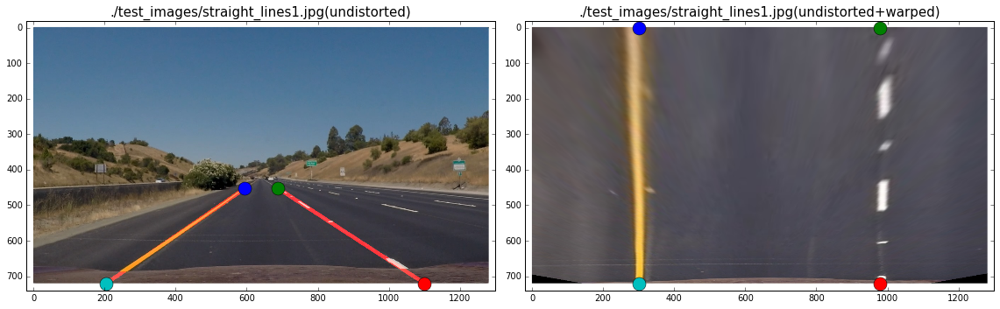

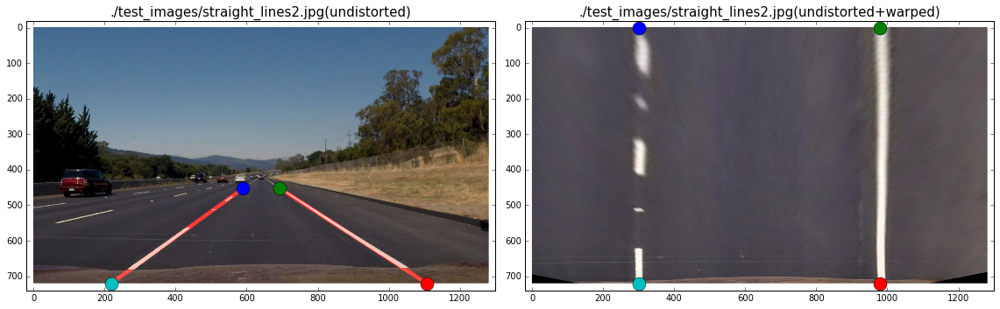

src:
[[ 589.00000  453.00000]
 [ 693.00000  453.00000]
 [1106.00000  720.00000]
 [ 218.00000  720.00000]]
dst:
[[ 300.00000    0.00000]
 [ 980.00000    0.00000]
 [ 980.00000  720.00000]
 [ 300.00000  720.00000]]
M:
[[  -0.54570   -1.49227  974.90712]
 [  -0.00000   -1.93020  874.38088]
 [  -0.00000   -0.00238    1.00000]]
Minv:
[[   0.14559   -0.78894  547.82353]
 [   0.00000   -0.51815  453.00000]
 [  -0.00000   -0.00123    1.00000]]


In [10]:
straight_lines_files = glob.glob("./test_images/straight*.jpg")
M = []
Minv = []
for file in straight_lines_files:
    image = mpimg.imread(file)
    xsize, ysize = img_size = (image.shape[1], image.shape[0])
    
    undist = cv2.undistort(image, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    line_img = np.zeros(image.shape, dtype=np.uint8)
    lines2 = get_straight_lines(undist)
    draw_lines(line_img, lines2, color=[255, 0, 0], thickness=10)
    
    combined_img = weighted_img(line_img, image)

    left_x1,  left_y1,  left_x2,  left_y2  = lines2[0][0]
    right_x1, right_y1, right_x2, right_y2 = lines2[1][0]
    
    # four points specifying (x, y) coordinates
    src = np.array([[left_x1,  left_y1],  [right_x1, right_y1],
                    [right_x2, right_y2], [left_x2,  left_y2]], dtype=np.float32)
    
    # four points specifying (x, y) coordinates
    dst = np.array([[offset,        0],     [xsize-offset,  0],  
                    [xsize-offset,  ysize], [offset,        ysize]], dtype=np.float32)

    M.append(cv2.getPerspectiveTransform(src, dst))
    Minv.append(cv2.getPerspectiveTransform(dst, src))

    warped = cv2.warpPerspective(undist, M[-1], (xsize, ysize), flags=cv2.INTER_LINEAR)
    
    # Visualize unwarped image next to the undistorted image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,10))
    ax1.imshow(combined_img)
    for coord in src:
        ax1.plot(coord[0], coord[1], 'o', markersize=15)
    ax1.set_title(file + "(undistorted)", fontsize=15)
    ax1.set_xlim(-20, xsize+20)
    ax1.set_ylim(ysize+20, -20)
    
    ax2.imshow(warped)
    for coord in dst:
        ax2.plot(coord[0], coord[1], 'o', markersize=15)
    ax2.set_title(file + "(undistorted+warped)", fontsize=15)
    
    ax2.set_xlim(-20, xsize+20)
    ax2.set_ylim(ysize+20, -20)
    plt.tight_layout()
    plt.show()

M = np.average(M, axis=0)
Minv = np.average(Minv, axis=0)
print("src:\n%s" % src)
print("dst:\n%s" % dst)
print("M:\n%s" % M)
print("Minv:\n%s" % Minv)


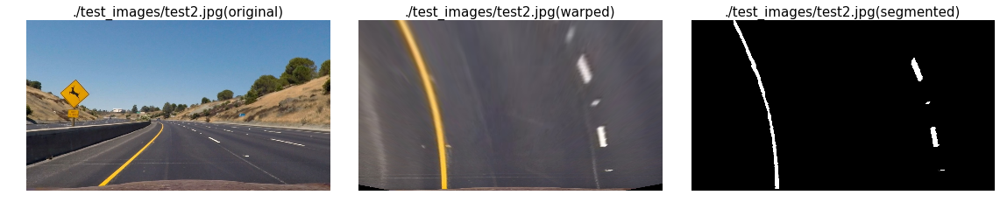

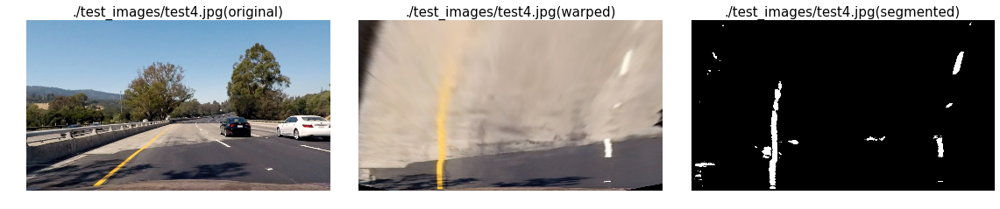

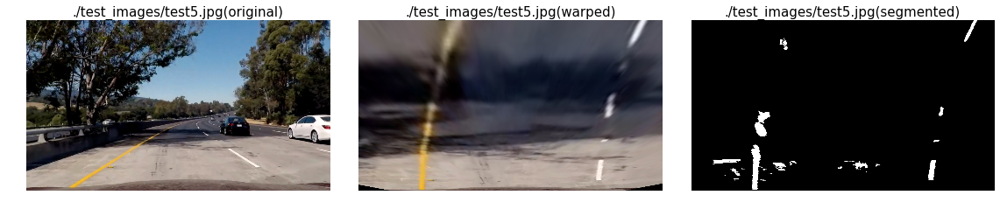

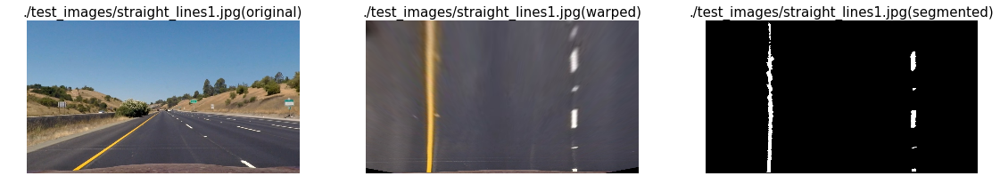

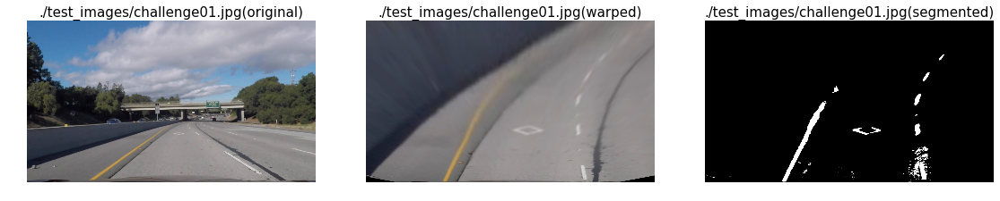

...

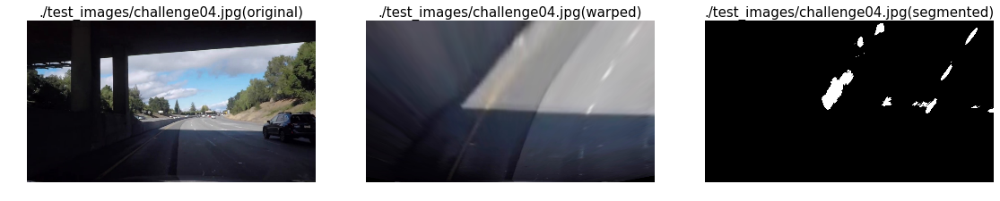

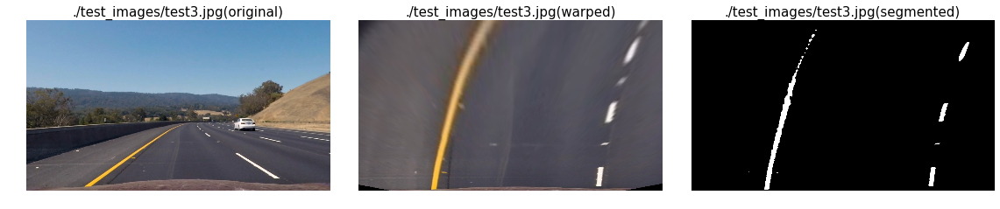

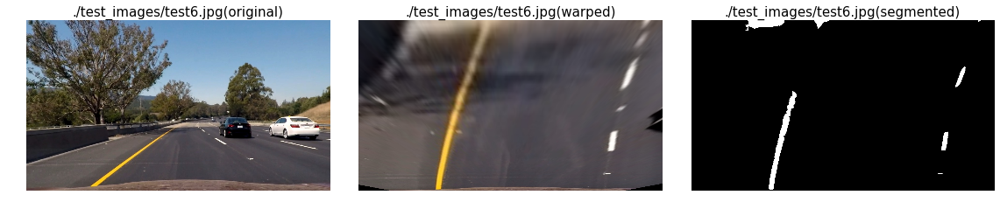

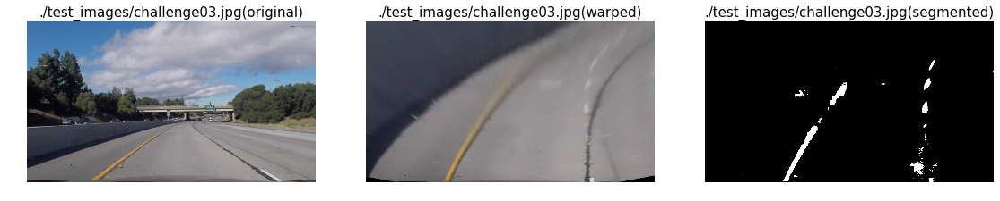

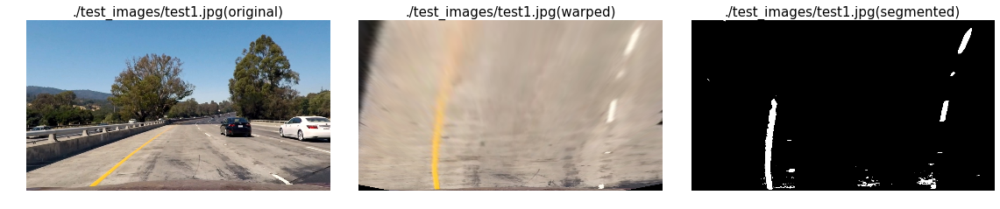

In [11]:
segmentation_config = {
    "ksize"            : 31,
    "sobel_thresh"     : [0.11, 0.7],
    "sobel_mag_thresh" : [0.11, 0.7],
    "sobel_dir_thresh" : [np.pi/4, np.pi/2],
    "hls_s_thresh"     : [0.4, 1.0],
    "hls_l_thresh"     : [0.7, 1.0],
    "lab_b_thresh"     : [0.7, 1.0],
    "max_pixel_cnt"    : 10000
}


segm = segmentation(segmentation_config)
test_files_lane_detection = glob.glob("./test_images/straight*.jpg")
test_files_challenge = glob.glob("./test_images/challenge*.jpg")
for file in test_files: #_challenge: #random.sample(test_files, 8):
    img = mpimg.imread(file)
    xsize, ysize = img_size = (image.shape[1], image.shape[0])
    undist = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    segmented = segm.run_pipeline(warped)

    # Visualize unwarped image next to the undistorted image
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,10))
    ax1.imshow(undist)
    ax1.set_title(file + "(original)", fontsize=15)
    ax1.set_axis_off()
    ax2.imshow(warped, cmap='gray')
    ax2.set_title(file + "(warped)", fontsize=15)
    ax2.set_axis_off()
    ax3.imshow(segmented, cmap='gray')
    ax3.set_title(file + "(segmented)", fontsize=15)
    ax3.set_axis_off()
    plt.tight_layout()
    plt.show()

## Lane detection

Two approaches considered:
* Sliding window with convolutoin
* Histogram

In [12]:
%matplotlib inline

# A class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        #self.recent_xfitted = [] 
        # average x values of the fitted line over the last n iterations
        self.bestx = np.array([0], dtype='float')
        # x values of segmented line pixels
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = np.zeros((3), dtype='float')
        # polynomial coefficients for the most recent fit
        self.current_fit = np.zeros((3), dtype='float')
        # coefficients covariance of fit
        self.covariance = np.zeros((3), dtype='float')
        # residuals of last line fit
        self.residuals = 0
        # radius of curvature of the line in some units
        self.radius_of_curvature = 0 
        # distance in meters of vehicle center from the line
        self.line_base_pos = 0 
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        # x values for detected line pixels
        self.allx = []  
        # y values for detected line pixels
        self.ally = []

        
class lane_detection():
    def __init__(self, config):
        """
        Params:
            nr_windows
                number of sliding windows    

            margin
                width of the windows +/- margin

            minpix
                minimum number of pixels found to recenter window
                
            buffer_size
                buffer size of ringbuffer for line fit coefficients and x-coordinates for fitted lines

            verbose
                if true, print out diagnostic messages and warnings

            use_ransac
                if true an iterative RANSAC line fitting approach is used instead of simple polyfit

            ransac_iter
                amount of RANSAC iterations

            covariance_offset_thresh
                threshold of fit[2] coefficient (polynomial offset) when evaluating the variance of the line fit
        """
        
        self.set_config(config)
        self.left_line  = Line()
        self.right_line = Line()
        self.left_fit_buffer  = deque(maxlen=self.buffer_size)
        self.right_fit_buffer = deque(maxlen=self.buffer_size)
        self.left_xfitted_buffer = deque(maxlen=self.buffer_size)
        self.right_xfitted_buffer = deque(maxlen=self.buffer_size)
        self.left_line_curv_buffer = deque(maxlen=self.buffer_size)
        self.right_line_curv_buffer = deque(maxlen=self.buffer_size)


    def set_config(self, config):
        if "nr_windows" in config:
            self.nr_windows=config["nr_windows"]
        else:
            self.nr_windows=10

        if "margin" in config:
            self.margin=config["margin"]
        else:
            self.margin=100
        
        if "minpix" in config:
            self.minpix=config["minpix"]
        else:
            self.minpix=50
        if "buffer_size" in config:
            self.buffer_size=config["buffer_size"]
        else:
            self.buffer_size=50
        if "verbose" in config:
            self.verbose = config["verbose"]
        else:
            self.verbose = False
        if "use_ransac" in config:
            self.use_ransac = config["use_ransac"]
        else:
            self.use_ransac = False
        if "ransac_iter" in config:
            self.ransac_iter = config["ransac_iter"]
        else:
            self.ransac_iter = 10
        if "covariance_offset_thresh" in config:
            self.covariance_offset_thresh = config["covariance_offset_thresh"]
        else:
            self.covariance_offset_thresh = 1000
            
        # Define conversions in x and y from pixel space to meters
        self.ym_per_pix =  30 / 720 # meters per pixel in y dimension
        self.xm_per_pix = 3.7 / 700 # meters per pixel in x dimension
        self.hist_bottom_offset = 30 # pixels from bottom of image to omit for initial histogram


    def window_mask(self, width, height, img_ref, center, level):
        output = np.zeros_like(img_ref)
        interval_left  = int(img_ref.shape[0] - (level+1)*height)
        interval_right = int(img_ref.shape[0] - level*height)
        output[interval_left:interval_right, max(0, center-width//2):min(center+width//2, img_ref.shape[1])] = 1
        return output


    def find_window_centroids(self, image):
        window_height = image.shape[0] // self.nr_windows # Break image into 9 vertical layers since image height is 720
        
        window_centroids = [] # Store the (left,right) window centroid positions per level
        window = np.ones(self.margin) # Create our window template that we will use for convolutions

        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 

        # Sum quarter bottom of image to get slice, could use a different ratio
        l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
        l_center = int(np.argmax(np.convolve(window,l_sum))-self.margin/2)
        r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
        r_center = int(np.argmax(np.convolve(window,r_sum))-self.margin/2+int(image.shape[1]/2))

        # Add what we found for the first layer
        window_centroids.append((l_center,r_center))

        # Go through each layer looking for max pixel locations
        for level in range(1,(int)(image.shape[0]/window_height)):
            # convolve the window into the vertical slice of the image
            interval_left  = int(image.shape[0]-(level+1)*window_height)
            interval_right = int(image.shape[0]-level*window_height)
            image_layer = np.sum(image[interval_left:interval_right,:], axis=0)
            conv_signal = np.convolve(window, image_layer)
            # Find the best left centroid by using past left center as a reference
            # Use self.margin/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = self.margin/2
            l_min_index = int(max(l_center+offset-self.margin,0))
            l_max_index = int(min(l_center+offset+self.margin,image.shape[1]))
            l_center    = int(np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset)
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-self.margin,0))
            r_max_index = int(min(r_center+offset+self.margin,image.shape[1]))
            r_center    = int(np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset)
            # Add what we found for that layer
            window_centroids.append((l_center, r_center))

        return window_centroids

    
    def out_image(self, image):
        window_centroids = self.find_window_centroids(image)
        window_height = image.shape[0] // self.nr_windows # Break image into 9 vertical layers since image height is 720
        # If we found any window centers
        if len(window_centroids) > 0:

            # Points used to draw all the left and right windows
            l_points = np.zeros_like(image)
            r_points = np.zeros_like(image)

            # Go through each level and draw the windows 
            for level in range(len(window_centroids)):
                # Window_mask is a function to draw window areas
                l_mask = self.window_mask(self.margin, window_height, image, window_centroids[level][0], level)
                r_mask = self.window_mask(self.margin, window_height, image, window_centroids[level][1], level)
                # Add graphic points from window mask here to total pixels found 
                l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
                r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

            # Draw the results
            template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
            zero_channel = np.zeros_like(template) # create a zero color channel
            template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
            warpage= np.dstack((image, image, image))*255 # making the original road pixels 3 color channels
            output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

        # If no window centers found, just display orginal road image
        else:
            output = np.array(cv2.merge((warped, warped, warped)), np.uint8)

        return output

    
    def interpolate_fit(self):
        if ((self.left_line.covariance[2] > self.right_line.covariance[2]) and (self.left_line.residuals > self.right_line.residuals)):
            if self.verbose:
                print("Choosing right fit!")
            # Get quadratic and linear from other line
            #self.left_line.current_fit[0:2] = self.right_line.current_fit[0:2]
            # or just take average 
            self.left_line.current_fit[0:2] = np.average([self.left_line.current_fit[0:2], self.right_line.current_fit[0:2]], axis=0)
            # and estimate a new offset
            a, b = self.left_line.current_fit[0:2]
            self.left_line.current_fit[2] = np.average(self.left_line.allx - a*self.left_line.ally**2 - b*self.left_line.ally)
        elif ((self.right_line.covariance[2] > self.left_line.covariance[2]) and (self.right_line.residuals > self.left_line.residuals)):
            if self.verbose:
                print("Choosing left fit!")
            # Get quadratic and linear from other line
            #self.right_line.current_fit[0:2] = self.left_line.current_fit[0:2]
            # or just take average 
            self.right_line.current_fit[0:2] = np.average([self.right_line.current_fit[0:2], self.left_line.current_fit[0:2]], axis=0)
            # and estimate a new offset
            a, b = self.right_line.current_fit[0:2]
            self.right_line.current_fit[2] = np.average(self.right_line.allx - a*self.right_line.ally**2 - b*self.right_line.ally)

            
    def draw_searchwindow(self, out_img, ploty):
            # Generate a polygon to illustrate the search window area
            # And recast the x and y points into usable format for cv2.fillPoly()
            left_line_window1 = np.array([np.transpose(np.vstack([self.left_line.bestx - self.margin, ploty]))])
            left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([self.left_line.bestx + self.margin, ploty])))])
            left_line_pts = np.hstack((left_line_window1, left_line_window2))
            right_line_window1 = np.array([np.transpose(np.vstack([self.right_line.bestx - self.margin, ploty]))])
            right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([self.right_line.bestx + self.margin, ploty])))])
            right_line_pts = np.hstack((right_line_window1, right_line_window2))

            # Draw the search window onto the warped blank image
            window_img = np.zeros_like(out_img).astype(np.uint8)
            cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
            cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
            out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
            return out_img

        
    def fit_lane_line(self, binary_warped, reuse_last_fit=False):
        xsize, ysize = img_size = (binary_warped.shape[1], binary_warped.shape[0])
        
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero    = binary_warped.nonzero()
        nonzeroy   = np.array(nonzero[0])
        nonzerox   = np.array(nonzero[1])
        ploty      = np.linspace(0, ysize-1, ysize, dtype=np.uint16)
        self.bestx = np.zeros((ysize))
        
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255 

        # we can only re-use our last fit if there exists one!
        if reuse_last_fit and sum(self.left_line.best_fit) and sum(self.right_line.best_fit):
            left_lane_inds  = ((nonzerox > (np.polyval(self.left_line.best_fit, nonzeroy) - self.margin)) &
                               (nonzerox < (np.polyval(self.left_line.best_fit, nonzeroy) + self.margin)))

            right_lane_inds = ((nonzerox > (np.polyval(self.right_line.best_fit, nonzeroy) - self.margin)) &
                               (nonzerox < (np.polyval(self.right_line.best_fit, nonzeroy) + self.margin)))
        else:

            if self.verbose:
                print("Finding starting point for window search with histogram")
            # Take a histogram of the bottom half of the image as a starting point to find the lanes
            histogram = np.sum(binary_warped[ysize//2:ysize-self.hist_bottom_offset,:], axis=0)
            if sum(histogram) == 0.0:
                print("Histogram empty, probably due to bad segmentation :(")
                self.left_line.detected = False
                self.right_line.detected = False
                return (self.left_line, self.right_line, out_img)
            
            # Filter histogram
            histogram = signal.medfilt(histogram, 29)

            # Find peaks in left and right half of the histogram
            midpoint  = xsize // 2
            histogram_peaks_left  = np.array(signal.find_peaks_cwt(histogram[:midpoint-self.margin//2], np.arange(1, 10)))
            histogram_peaks_right = np.array(signal.find_peaks_cwt(histogram[midpoint+self.margin//2:], np.arange(1, 10)[::-1])) + midpoint + self.margin//2
            #plt.plot(720-histogram*5)

            if len(histogram_peaks_left) == 0 or len(histogram_peaks_right) == 0:
                print("Couldn't find any peaks in initial histogram search :(")
                self.left_line.detected = False
                self.right_line.detected = False
                #plt.show()
                return (self.left_line, self.right_line, out_img)


            if np.isclose(sum(histogram[histogram_peaks_left]), 0.0):
                print("histogram_peaks_left: ", histogram_peaks_left)
                print("histogram[histogram_peaks_left]: ", histogram[histogram_peaks_left])
                self.left_line.detected = False
                self.right_line.detected = False
                return (self.left_line, self.right_line, out_img)

            if np.isclose(sum(histogram[histogram_peaks_right]), 0.0):
                print("histogram_peaks_right: ", histogram_peaks_right)
                print("histogram[histogram_peaks_right]: ", histogram[histogram_peaks_right])                
                self.left_line.detected = False
                self.right_line.detected = False
                return (self.left_line, self.right_line, out_img)
            
            # Find the peak of the left and right halves of the histogram
            # These will be the starting point for the left and right lines
            leftx_base  = int(np.average(histogram_peaks_left,  weights=histogram[histogram_peaks_left]))
            rightx_base = int(np.average(histogram_peaks_right, weights=histogram[histogram_peaks_right]))

            #plt.plot(histogram_peaks_left,  [30 for i in range(len(histogram_peaks_left))], marker=".", markersize=10)
            #plt.plot(histogram_peaks_right, [30 for i in range(len(histogram_peaks_right))], marker=".", markersize=10)
            #plt.plot(leftx_base, 40,  marker="x", markersize=10)
            #plt.plot(rightx_base, 40,  marker="x", markersize=10)
            #plt.show()
            
            # Set height of windows
            window_height = ysize // self.nr_windows

            # Current positions to be updated for each window
            leftx_current  = leftx_base
            rightx_current = rightx_base

            # Create empty lists to receive left and right lane pixel indices
            left_lane_inds  = []
            right_lane_inds = []

            # Step through the windows one by one
            for window in range(self.nr_windows):
                # Identify window boundaries in x and y (and right and left)
                win_y_low  = ysize - (window+1)*window_height
                win_y_high = ysize - window*window_height
                win_xleft_low = leftx_current - self.margin
                win_xleft_high = leftx_current + self.margin
                win_xright_low = rightx_current - self.margin
                win_xright_high = rightx_current + self.margin
                # Draw the windows on the visualization image
                cv2.rectangle(out_img, (win_xleft_low,  win_y_low), (win_xleft_high,  win_y_high),  (0,255,0), 2) 
                cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high),  (0,255,0), 2) 
                # Identify the nonzero pixels in x and y within the window
                good_left_inds = ((nonzeroy >= win_y_low)       & (nonzeroy < win_y_high) & 
                                  (nonzerox >= win_xleft_low)   & (nonzerox < win_xleft_high)).nonzero()[0]
                good_right_inds = ((nonzeroy >= win_y_low)      & (nonzeroy < win_y_high) & 
                                   (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
                # Append these indices to the lists
                left_lane_inds.append(good_left_inds)
                right_lane_inds.append(good_right_inds)
                # If you found > minpix pixels, recenter next window on their mean position
                if len(good_left_inds) > self.minpix:
                    leftx_current = np.int(np.mean(nonzerox[good_left_inds])*1.0) 
                if len(good_right_inds) > self.minpix:        
                    rightx_current = np.int(np.mean(nonzerox[good_right_inds])*1.0)

            # Concatenate the arrays of indices
            left_lane_inds  = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)

        if len(left_lane_inds) == 0 or len(right_lane_inds) == 0:
            if len(left_lane_inds) == 0:
                print("Couldn't find any pixels for left line :(")
                self.left_line.detected = False
            if len(right_lane_inds) == 0:
                print("Couldn't find any pixels for right line :(")
                self.right_line.detected = False
            return (self.left_line, self.right_line, out_img)
        
        # Mark pixels in left and right line
        out_img[nonzeroy[left_lane_inds],  nonzerox[left_lane_inds]]  = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Extract detected left and right line pixel positions
        self.left_line.allx  = leftx   = nonzerox[left_lane_inds]
        self.right_line.allx = rightx  = nonzerox[right_lane_inds] 
        self.left_line.ally  = lefty   = nonzeroy[left_lane_inds]
        self.right_line.ally = righty  = nonzeroy[right_lane_inds] 

        try:
            if len(lefty) != len(leftx):
                raise ValueError("len(lefty) != len(leftx)!!!!!")
            if len(righty) != len(rightx):
                raise ValueError("len(lefty) != len(leftx)!!!!!")
            if len(lefty) == 0 or len(leftx) == 0:
                raise ValueError("Either lefty or leftx empty!")            
            if len(righty) == 0 or len(rightx) == 0:
                raise ValueError("Either righty or rightx empty!")            
        except Exception as error:
            print("Error: " + str(error.args[0]))
            self.left_line.detected = False
            return (self.left_line, self.right_line, out_img)
        
        # Fit a second order polynomial to each line
        if self.use_ransac:
            # RANSAC approach, more robust against outlier, but also more computational intense
            #
            # n – minimum number of data points required to fit the model
            # k – maximum number of iterations allowed in the algorithm
            # t – threshold value to determine when a data point fits a model
            # d – number of close data points required to assert that a model fits well to data
            # f – fraction of close data points required
            self.left_line.current_fit, self.left_line.covariance, self.left_line.residuals = ransac_polyfit(
                lefty,  leftx,  order=2,  n=leftx.size//4,  k=self.ransac_iter,  t=15,  d=leftx.size//8,  f=0.1)
            if sum(self.left_line.current_fit) != 0.0:
                self.left_line.detected = True
            else:
                self.left_line.detected = False
                return (self.left_line, self.right_line, out_img)

            self.right_line.current_fit, self.right_line.covariance, self.right_line.residuals = ransac_polyfit(
                righty,  rightx,  order=2,  n=rightx.size//4,  k=self.ransac_iter,  t=15,  d=rightx.size//8,  f=0.1)
            if sum(self.right_line.current_fit) != 0.0:
                self.right_line.detected = True
            else:
                self.right_line.detected = False
                return (self.left_line, self.right_line, out_img)
                
        else:
            #
            # Default: Just use simple polyfit function 
            #
            try:
                self.left_line.current_fit, self.left_line.covariance  = np.polyfit(lefty, leftx, 2, cov=True)
                p, self.left_line.residuals, rank, singular_values, rcond = np.polyfit(lefty, leftx, 2, full=True)
                # We only want to diagonal variance elements
                self.left_line.covariance  = np.diag(self.left_line.covariance)
            except:
                self.left_line.current_fit = self.left_line.best_fit
                print("failed fitting of left line!")
                self.left_line.detected = False
                self.left_line.covariance = np.ones((3))
                return (self.left_line, self.right_line, out_img)

            self.left_line.detected = True

            try:
                self.right_line.current_fit, self.right_line.covariance = np.polyfit(righty, rightx, 2, cov=True)
                p, self.right_line.residuals, rank, singular_values, rcond = np.polyfit(righty, rightx, 2, full=True)
                # We only want to diagonal variance elements
                self.right_line.covariance = np.diag(self.right_line.covariance)
            except:
                self.right_line.current_fit = self.right_line.best_fit
                print("failed fitting of right line!")
                self.right_line.detected = False
                self.right_line.covariance = np.ones((3))
                return (self.left_line, self.right_line, out_img)

            self.right_line.detected = True

        
        """
        # check if lines are somewhat parallel by comparing sign of coefficients
        # only if all signs of the left and right line fit are identical we assume parallel lines
        if sum(np.sign(self.left_line.current_fit) == np.sign(self.right_line.current_fit)) != 3:
            if self.verbose: 
                print("Detected lines are not parallel, i.e. different signs for line fit coefficients!")
            #self.interpolate_fit()

        # check if apex point of left and right line fit is within a reasonable range: apex > 0
        apex_left  = np.roots(np.polyder(self.left_line.current_fit))
        apex_right = np.roots(np.polyder(self.right_line.current_fit))
        if apex_left < 0:
            self.left_line.detected = False
        if apex_right < 0:
            self.right_line.detected = False
        """
        
        # Check 1: check if lines are intersecting already within the unwarped image
        line_intersect_points = np.roots(self.right_line.current_fit - self.left_line.current_fit)
        for intersection_point in line_intersect_points:
            if not np.iscomplex(intersection_point) and (intersection_point > 0) and (intersection_point < ysize):
                print("Line intersection within image at y=%.0f!" % intersection_point)
                self.left_line.detected = False
                self.right_line.detected = False

        # Check 2: check if both line fits are the same
        if sum(np.isclose(self.left_line.current_fit, self.right_line.current_fit)) == 3:
            print("Left and right line fit are the same!")
            self.left_line.detected = False
            self.right_line.detected = False

        # Check 3: simple quality check, check if variance of 3rd coeff (polynomial offset) is above threshold:
        if self.left_line.covariance[2] > self.covariance_offset_thresh:
            self.left_line.detected = False
        if self.right_line.covariance[2] > self.covariance_offset_thresh:
            self.right_line.detected = False
            
        # Generate x values for plotting
        left_xfit  = np.polyval(self.left_line.current_fit, ploty)
        right_xfit = np.polyval(self.right_line.current_fit, ploty)

        if reuse_last_fit:
            # Moving average of polynomial coefficients over self.buffer_size iterations for robustness
            # polynomial coefficients averaged over the last n iterations
            self.left_fit_buffer.append(self.left_line.current_fit)
            self.right_fit_buffer.append(self.right_line.current_fit)

            # Moving average of fitted x-positions for lines
            self.left_xfitted_buffer.append(left_xfit)
            self.right_xfitted_buffer.append(right_xfit)
            
            # and add fitted x values to buffer
            if len(self.left_fit_buffer) > 0:
                self.left_line.best_fit  = np.average(self.left_fit_buffer, axis=0)
                self.right_line.best_fit = np.average(self.right_fit_buffer, axis=0)
            else:
                self.left_line.best_fit  = self.left_line.current_fit
                self.right_line.best_fit = self.right_line.current_fit

            # Difference in fit coefficients between last and new fits
            if len(self.left_fit_buffer) > 0:
                self.left_line.diffs  = self.left_line.current_fit  - self.left_fit_buffer[-1]
                self.right_line.diffs = self.right_line.current_fit - self.right_fit_buffer[-1]
            else:
                self.left_line.diffs  = np.zeros((3))
                self.right_line.diffs = np.zeros((3))
            
            # Average x values of the fitted line over the last n iterations
            if len(self.left_xfitted_buffer) > 0:
                self.left_line.bestx  = np.average(self.left_xfitted_buffer, axis=0)
                self.right_line.bestx = np.average(self.right_xfitted_buffer, axis=0)
            else:
                self.left_line.bestx = left_xfit
                self.right_line.bestx = right_xfit

            out_img = self.draw_searchwindow(out_img, ploty)

        else:
            # Clear buffers, their contents are already invalid
            self.left_fit_buffer.clear()
            self.right_fit_buffer.clear()
            self.left_xfitted_buffer.clear()
            self.right_xfitted_buffer.clear()
            
            self.left_line.best_fit  = self.left_line.current_fit
            self.left_line.bestx  = left_xfit
            self.right_line.best_fit = self.right_line.current_fit
            self.right_line.bestx = right_xfit

        # Fit new polynomials also to x,y in world space
        left_fit_cr  = np.polyfit(ploty*self.ym_per_pix, self.left_line.bestx*self.xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*self.ym_per_pix, self.right_line.bestx*self.xm_per_pix, 2)
        
        y_eval = ysize # evaluate curvature in the bottom of the image, close to the car

        # Calculate radius of curvature of the lines in meters
        left_curvature = ((1 + (2*left_fit_cr[0]*y_eval*self.ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curvature = ((1 + (2*right_fit_cr[0]*y_eval*self.ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

        self.left_line_curv_buffer.append(left_curvature)
        self.right_line_curv_buffer.append(right_curvature)
        
        self.left_line.radius_of_curvature  = np.average(self.left_line_curv_buffer)
        self.right_line.radius_of_curvature = np.average(self.right_line_curv_buffer)
        
        # Calculate distance between image center and lines in meters
        left_fitx_cr  = np.polyval(left_fit_cr,  [y_eval*self.ym_per_pix])
        right_fitx_cr = np.polyval(right_fit_cr, [y_eval*self.ym_per_pix])
        self.left_line.line_base_pos  = self.xm_per_pix*xsize/2 - left_fitx_cr
        self.right_line.line_base_pos = right_fitx_cr - self.xm_per_pix*xsize/2
        
        return (self.left_line, self.right_line, out_img)


segmentation_config = {
    "ksize"            : 31,
    "sobel_thresh"     : [0.11, 0.7],
    "sobel_mag_thresh" : [0.11, 0.7],
    "sobel_dir_thresh" : [np.pi/4, np.pi/2],
    "hls_s_thresh"     : [0.4, 1.0],
    "hls_l_thresh"     : [0.7, 1.0],
    "lab_b_thresh"     : [0.7, 1.0],
    "max_pixel_cnt"    : 10000
}

lane_detection_config = {
    "nr_windows"     : 11,
    "margin"         : 120,
    "minpix"         : 60,
    "buffer_size"    : 10,
    "covariance_offset_thresh" : 1500,
    "use_ransac"     : True,
    "ransac_iter"    : 10,
    "verbose"        : True
}

File:  ./test_images/challenge01.jpg
Finding starting point for window search with histogram
Left / Right line residuals:  46669.8531859 26017.178697
Left / Right fit covariance:  [   0.00000    0.00006    3.70067] [   0.00000    0.00004    1.79282]
Coefficients for left / right line:   [   0.00035   -0.87462  806.19629] [   0.00066   -0.65231 1101.20431]
Coefficient diffs left / right line:  [   0.00000    0.00000    0.00000] [   0.00000    0.00000    0.00000]
Apex left / right:  [1265.22158] [ 494.72676]


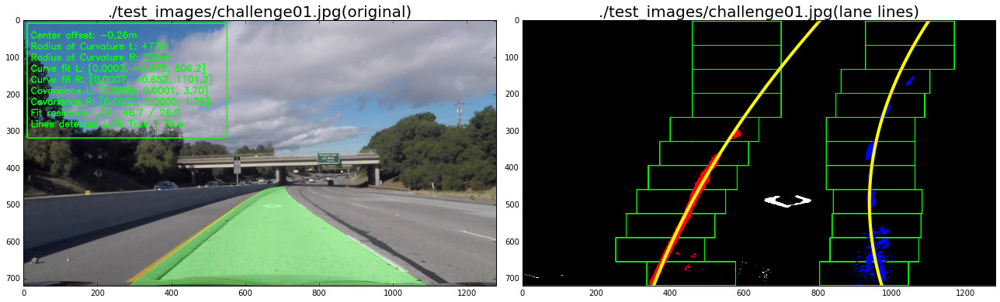

File:  ./test_images/challenge02.jpg
Finding starting point for window search with histogram


/home/phil/.conda/envs/CarND-TensorFlow-Lab/lib/python3.5/site-packages/scipy/signal/_peak_finding.py:412: RuntimeWarning: divide by zero encountered in double_scalars
  snr = abs(cwt[line[0][0], line[1][0]] / noises[line[1][0]])


Left / Right line residuals:  46687.1380693 10849.6585058
Left / Right fit covariance:  [   0.00000    0.00005    3.27045] [   0.00000    0.00003    1.08270]
Coefficients for left / right line:   [   0.00079   -1.49128  996.02991] [   0.00177   -1.86641 1413.70732]
Coefficient diffs left / right line:  [   0.00000    0.00000    0.00000] [   0.00000    0.00000    0.00000]
Apex left / right:  [ 946.81796] [ 526.46630]


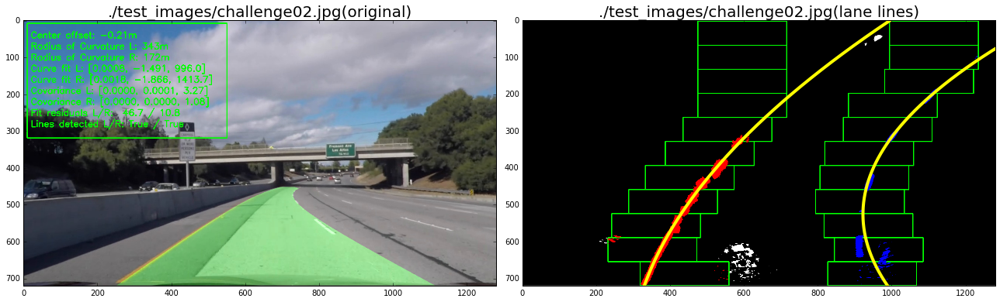

File:  ./test_images/challenge04.jpg
Finding starting point for window search with histogram
Left / Right line residuals:  40674.0120125 16649.3273592
Left / Right fit covariance:  [   0.00000    0.00002    0.13150] [   0.00000    0.00002    0.14258]
Coefficients for left / right line:   [   0.00052   -0.87291  799.86258] [   0.00038   -0.79134 1235.43222]
Coefficient diffs left / right line:  [   0.00000    0.00000    0.00000] [   0.00000    0.00000    0.00000]
Apex left / right:  [ 835.21731] [1049.78101]


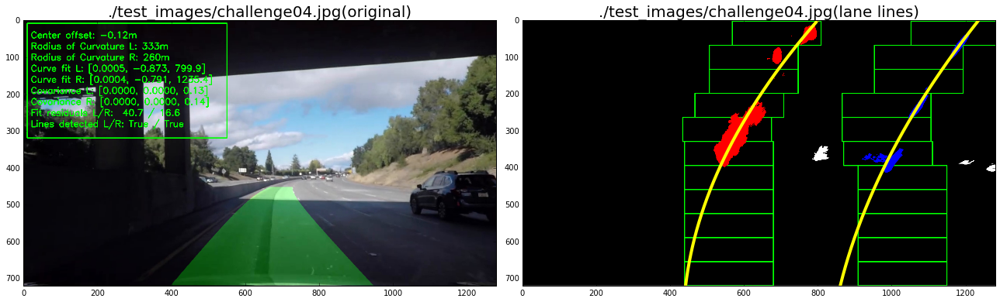

File:  ./test_images/challenge03.jpg
Finding starting point for window search with histogram
Left / Right line residuals:  38452.2925285 21086.8330608
Left / Right fit covariance:  [   0.00000    0.00008    5.60634] [   0.00000    0.00002    0.90595]
Coefficients for left / right line:   [   0.00020   -0.79090  818.12499] [   0.00021   -0.28434 1051.92310]
Coefficient diffs left / right line:  [   0.00000    0.00000    0.00000] [   0.00000    0.00000    0.00000]
Apex left / right:  [1976.61771] [ 665.84560]


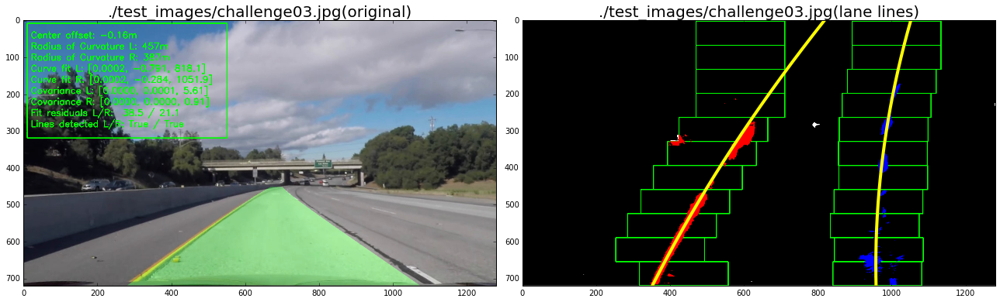

In [14]:
test_files_lane_detection = glob.glob("./test_images/straight*.jpg")
test_files_challenge = glob.glob("./test_images/challenge*.jpg")
segm = segmentation(segmentation_config)
detect_lanes = lane_detection(lane_detection_config)

for file in test_files_challenge:
    print("File: ", file)
    img = mpimg.imread(file)
    xsize, ysize = img_size = (img.shape[1], img.shape[0])
    undist = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    binary_warped = segm.run_pipeline(warped)
    #plt.imshow(binary_warped, cmap="gray")
    
    left_line, right_line, out_img = detect_lanes.fit_lane_line(binary_warped, reuse_last_fit=False)
    apex_left  = np.roots(np.polyder(left_line.current_fit))
    apex_right = np.roots(np.polyder(right_line.current_fit))

    print("Left / Right line residuals: ", left_line.residuals, right_line.residuals)
    print("Left / Right fit covariance: ", left_line.covariance, right_line.covariance)
    print("Coefficients for left / right line:  ", left_line.current_fit, right_line.current_fit)
    print("Coefficient diffs left / right line: ", left_line.diffs, right_line.diffs)
    print("Apex left / right: ", apex_left, apex_right)
    if not (left_line.detected or right_line.detected):
        print("Couldn't detect both lines properly!")

    car_lane_offset = left_line.line_base_pos - right_line.line_base_pos 

    # Generate x and y values for plotting
    ploty = np.linspace(0, ysize-1, ysize, dtype=np.uint16)
    # Create an image to draw the lines on
    color_warp = np.zeros_like(warped).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left  = np.array([np.transpose(np.vstack([left_line.bestx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, ploty])))])
    pts = np.array(np.hstack((pts_left, pts_right)))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_(pts), (0,255,0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, img_size) 
    # Combine the result with the original image
    result_img = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

    cv2.rectangle(result_img, (10, 10), (550, 320), color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Center offset: %.2fm" % car_lane_offset,
                (20,50), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Radius of Curvature L: %.0fm" % left_line.radius_of_curvature,
                (20,80), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Radius of Curvature R: %.0fm" % right_line.radius_of_curvature,
                (20,110), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Curve fit L: [%.4f, %.3f, %.1f]" % (left_line.current_fit[0], left_line.current_fit[1], left_line.current_fit[2]),
                (20,140), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Curve fit R: [%.4f, %.3f, %.1f]" % (right_line.current_fit[0], right_line.current_fit[1], right_line.current_fit[2]),
                (20,170), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Covariance L: [%.4f, %.4f, %.2f]" % (left_line.covariance[0], left_line.covariance[1], left_line.covariance[2]),
                (20,200), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Covariance R: [%.4f, %.4f, %.2f]" % (right_line.covariance[0], right_line.covariance[1], right_line.covariance[2]),
                (20,230), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Fit residuals L/R:  %.1f / %.1f" % (left_line.residuals/1e3, right_line.residuals/1e3),
                (20,260), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Lines detected L/R: %s / %s" % (left_line.detected, right_line.detected),
                (20,290), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,10))
    ax1.imshow(result_img)
    ax1.set_title(file + "(original)", fontsize=20)
    ax2.imshow(out_img)
    ax2.plot(left_line.bestx,  ploty, color="yellow", linewidth=4)
    ax2.plot(right_line.bestx, ploty, color="yellow", linewidth=4)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    ax2.set_title(file + "(lane lines)", fontsize=20)
    plt.tight_layout()
    plt.show()

## Test on videos

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from moviepy.editor import *


video_fps = 30
video_output_folder = "videos_output/"
videos = [
   "project_video.mp4",
   "challenge_video.mp4",
   "harder_challenge_video.mp4"
]

lane_detection_config["use_ransac"] = False
lane_detection_config["verbose"]    = False

segm = segmentation(segmentation_config)
detect_lanes = lane_detection(lane_detection_config)

def process_image(img):
    xsize, ysize = img_size = (img.shape[1], img.shape[0])
    undist = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    binary_warped = segm.run_pipeline(warped)

    left_line, right_line, out_img = detect_lanes.fit_lane_line(binary_warped, reuse_last_fit=True)
    if not left_line.detected or not right_line.detected:
        # search lines from scratch again!
        left_line, right_line, out_img = detect_lanes.fit_lane_line(binary_warped, reuse_last_fit=False)

    car_lane_offset = left_line.line_base_pos - right_line.line_base_pos

    # Generate x and y values for plotting
    ploty = np.linspace(0, ysize-1, ysize)

    # Create an image to draw the lines on
    color_warp = np.zeros_like(warped).astype(np.uint8)
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left  = np.array([np.transpose(np.vstack([left_line.bestx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, ploty])))])
    pts = np.array(np.hstack((pts_left, pts_right)))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_(pts), (0,255,0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, img_size) 
    # Combine the result with the original image
    result_img = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

    if annotate_video:
        cv2.rectangle(result_img, (10, 10), (550, 320), color=(0,255,0), thickness=2)
        cv2.putText(result_img, "Center offset: %.2fm" % car_lane_offset,
                    (20,50), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
        cv2.putText(result_img, "Radius of Curvature L: %.0fm" % left_line.radius_of_curvature,
                    (20,80), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
        cv2.putText(result_img, "Radius of Curvature R: %.0fm" % right_line.radius_of_curvature,
                    (20,110), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
        cv2.putText(result_img, "Curve fit L: [%.4f, %.3f, %.1f]" % (left_line.current_fit[0], left_line.current_fit[1], left_line.current_fit[2]),
                    (20,140), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
        cv2.putText(result_img, "Curve fit R: [%.4f, %.3f, %.1f]" % (right_line.current_fit[0], right_line.current_fit[1], right_line.current_fit[2]),
                    (20,170), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
        cv2.putText(result_img, "Covariance L: [%.4f, %.4f, %.2f]" % (left_line.covariance[0], left_line.covariance[1], left_line.covariance[2]),
                    (20,200), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
        cv2.putText(result_img, "Covariance R: [%.4f, %.4f, %.2f]" % (right_line.covariance[0], right_line.covariance[1], right_line.covariance[2]),
                    (20,230), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
        cv2.putText(result_img, "Fit residuals L/R:  %.1f / %.1f" % (left_line.residuals/1e3, right_line.residuals/1e3),
                    (20,260), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)
        cv2.putText(result_img, "Lines detected L/R: %s / %s" % (left_line.detected, right_line.detected),
                    (20,290), cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=(0,255,0), thickness=2)

        out_img_small = cv2.resize(out_img, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
        result_img[:ysize//2,xsize//2:,:] = out_img_small

    return result_img


for video in videos:
    if not os.path.exists(video_output_folder):
        os.makedirs(video_output_folder)
    result_path = video_output_folder + video
    if not os.path.isfile(video):
        print("Video %s doesn't exist!")
    else:
        clip1 = VideoFileClip(video) #.subclip(0,8)
        video_slowdown_factor = video_fps / clip1.fps
        clip1 = clip1.fx(vfx.speedx, video_slowdown_factor)
        white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
        %time white_clip.write_videofile(result_path, audio=False, fps=video_fps)

In [ ]:
HTML("""<video width="960" height="540" controls><source src="{0}"></video>""".format(result_path))

### Saving videos as animated gifs

In [ ]:
video_output_folder = "videos_output/"
videos = [
#   "project_video.mp4",
   "challenge_video.mp4",
]

video_fps = 10
clip_part = (3.0, 6.0)
resize_factor = 0.5

if not os.path.exists(video_output_folder):
    print("Output folder does not exist?!?")
for video in videos:
    result_path = video_output_folder + video
    if not os.path.isfile(result_path):
        print("Video %s doesn't exist!" % result_path)
        continue
    else:
        clip1 = VideoFileClip(result_path).subclip(*clip_part).resize(resize_factor)
        video_slowdown_factor = video_fps / clip1.fps
        clip1 = clip1.fx(vfx.speedx, video_slowdown_factor)
        %time clip1.write_gif(result_path+".gif", fps=video_fps)